In [1]:
library(ArchR)
# library(Signac)
set.seed(1)
addArchRThreads(threads = 1)
addArchRGenome("mm10")
library(tidyverse)
library(here)
library(Seurat)
library(gt)
library(ChIPseeker)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)
txdb <- TxDb.Mmusculus.UCSC.mm10.knownGene
library(clusterProfiler)
library(ReactomePA)
library(DOSE)
#plot track
library(scATACutils)
library(dplyr)
library(readr)
library(ggplot2)
library(org.Mm.eg.db)
library(ggpubr)
library(patchwork)


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .______      
          /   \     |   _ 

# Loading data like so

In [2]:
h5disableFileLocking()
Merged.proj2 <- readRDS(file= "./gonad_fil_somatic202112/Save-ArchR-Project.rds")

In [ ]:
getAvailableMatrices(Merged.proj2)
Merged.proj2 <- addImputeWeights(Merged.proj2,k=15,ka=4,td=3,sampleCells = 5000,reducedDims = "IterativeLSI")

In [3]:
h5disableFileLocking()
Merged.proj.male <- readRDS(file= "./Merged.proj.male.2023//Save-ArchR-Project.rds")


# Sertoli cell trajectory


In [5]:
Merged.proj2@cellColData$time_cluster <- paste0(Merged.proj2@cellColData$Sample,"_C",Merged.proj2@cellColData$cluster)

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d411d950508-Date-2022-01-18_Time-10-21-44.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 
3 
4 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d411d950508-Date-2022-01-18_Time-10-21-44.log



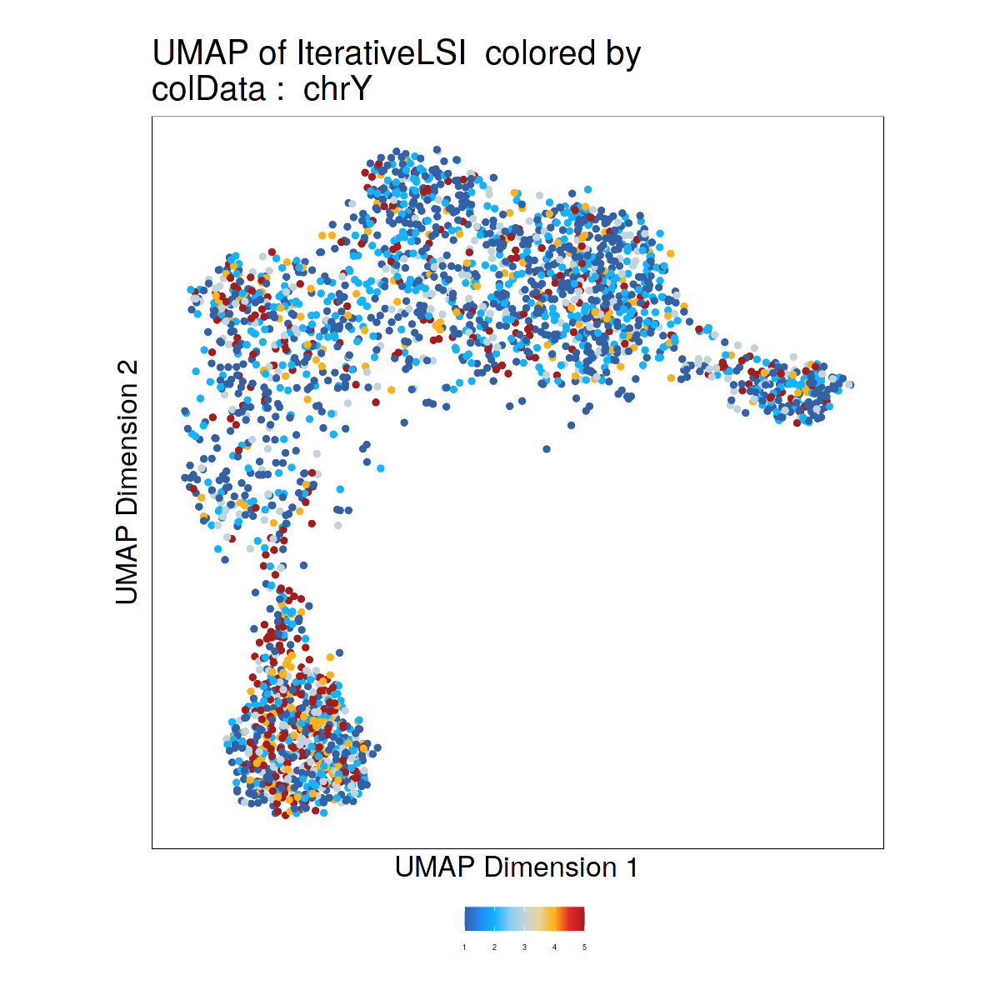

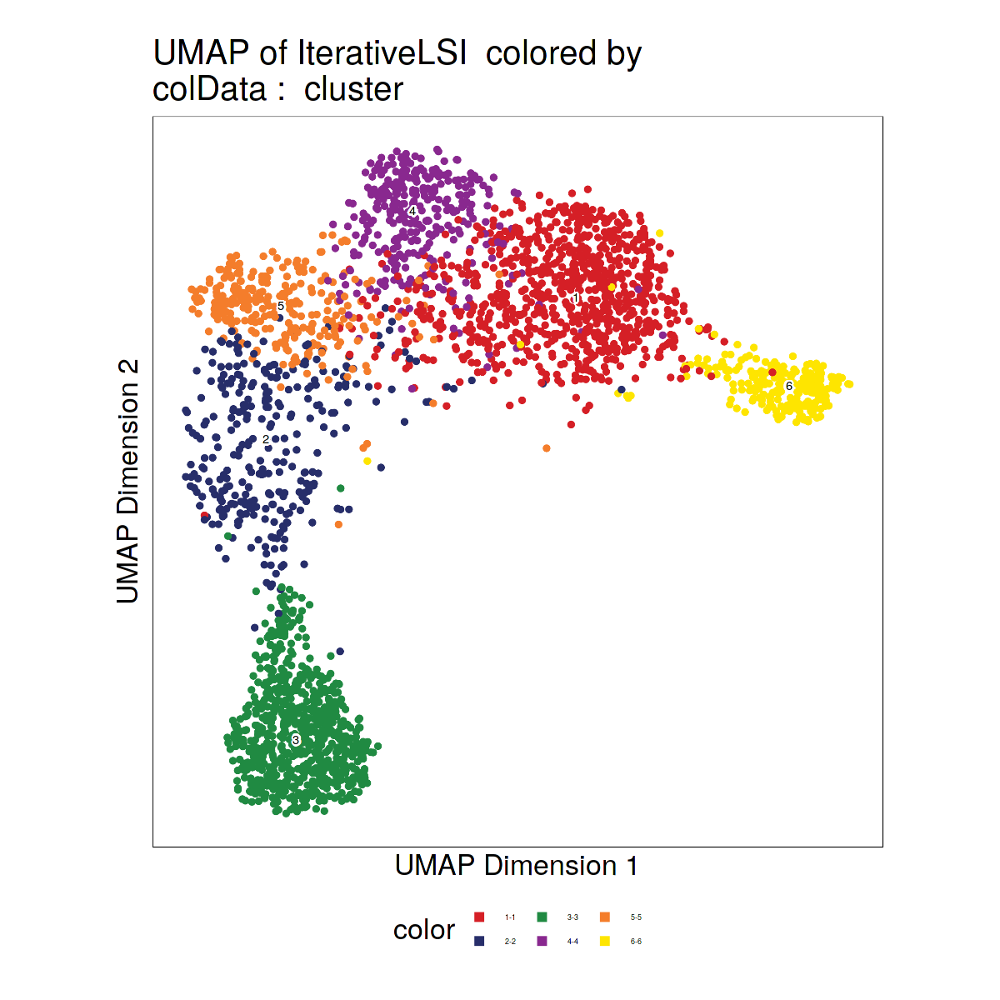

$chrY

$cluster

$Sample

$time_cluster


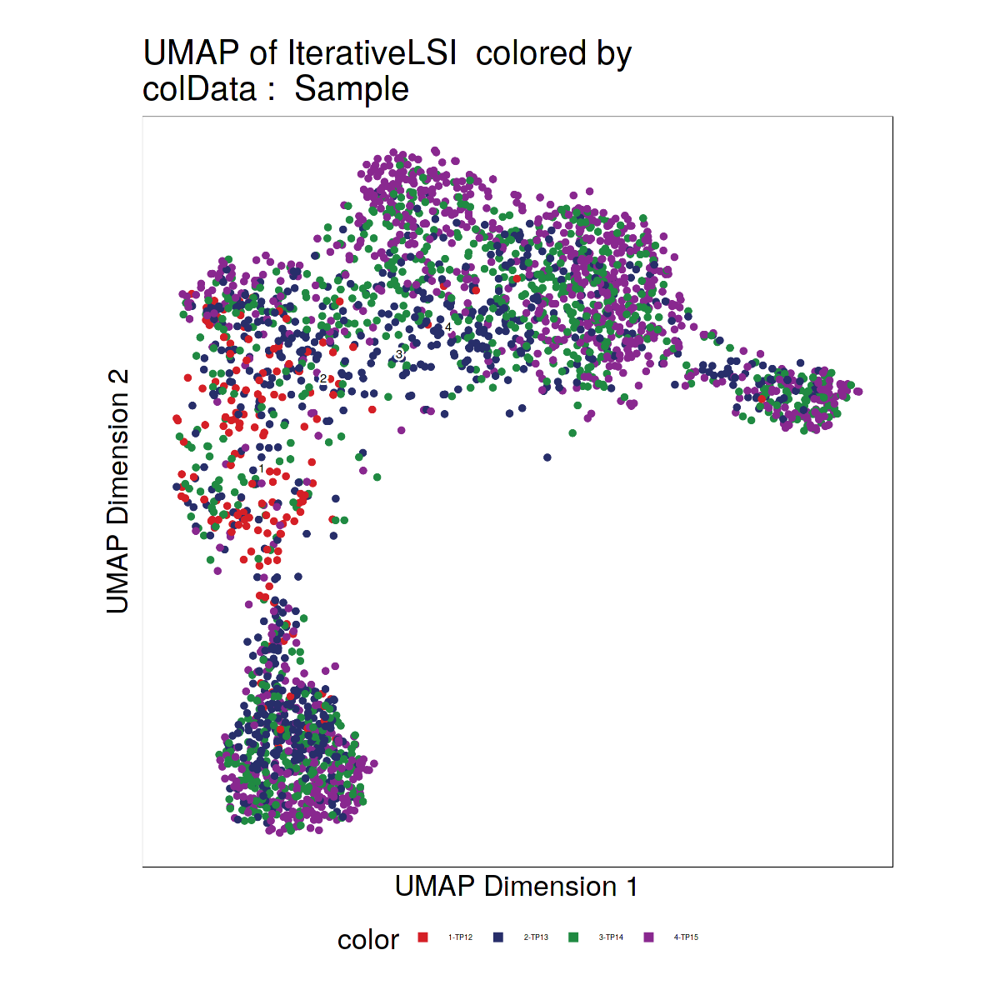

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d416cf68c7a-Date-2022-01-18_Time-10-21-50.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 
3 
4 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d416cf68c7a-Date-2022-01-18_Time-10-21-50.log



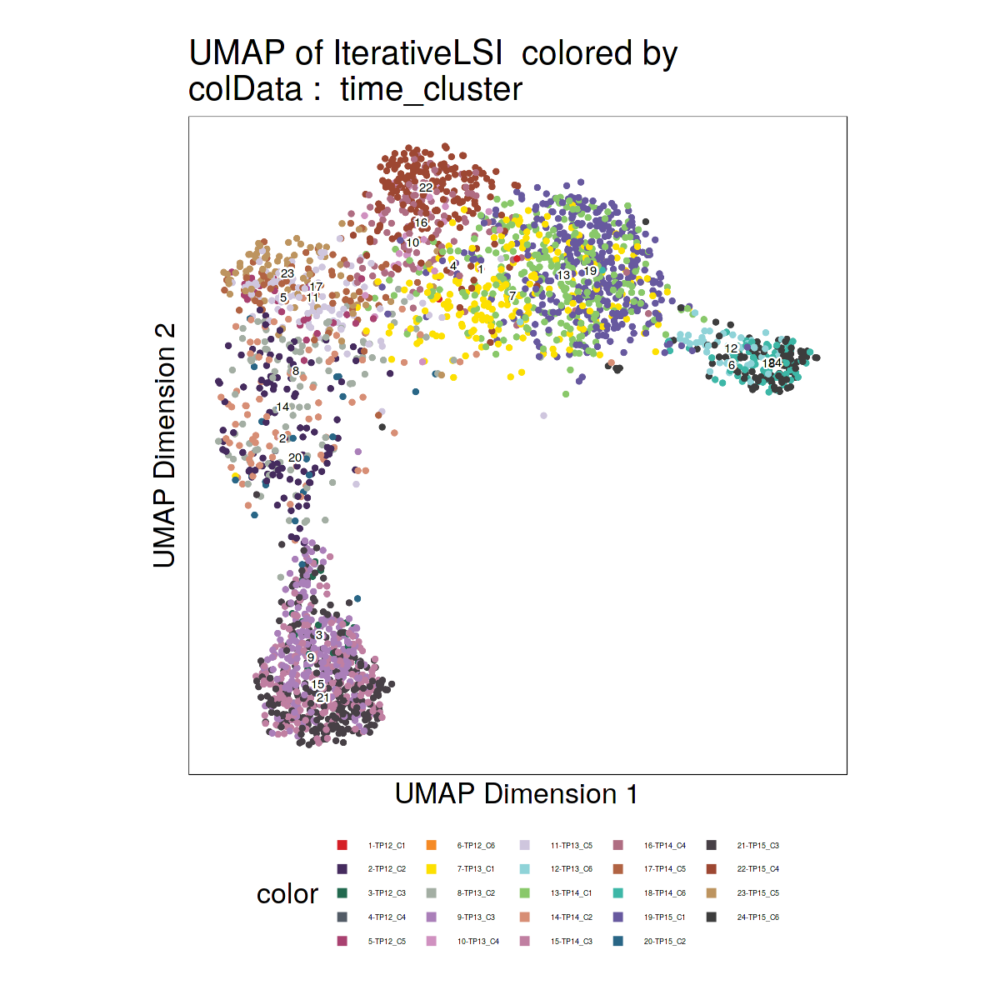

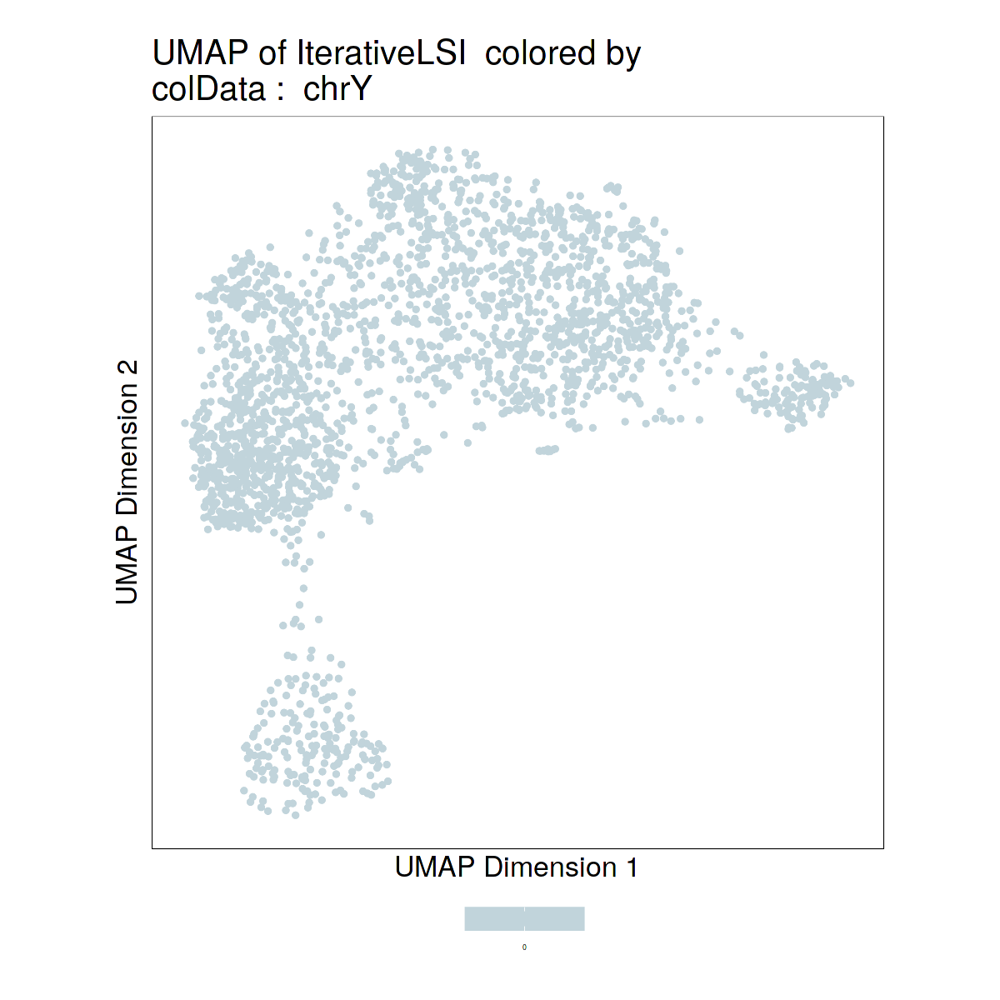

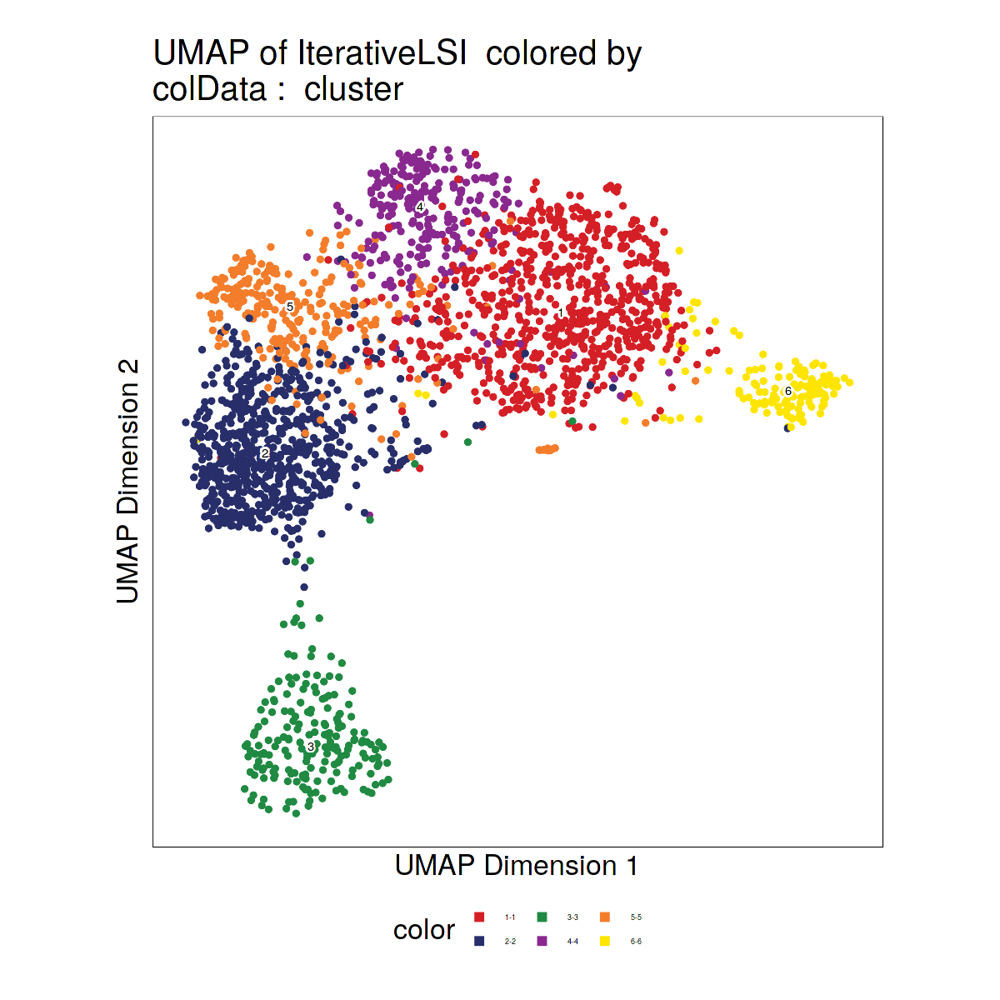

$chrY

$cluster

$Sample

$time_cluster


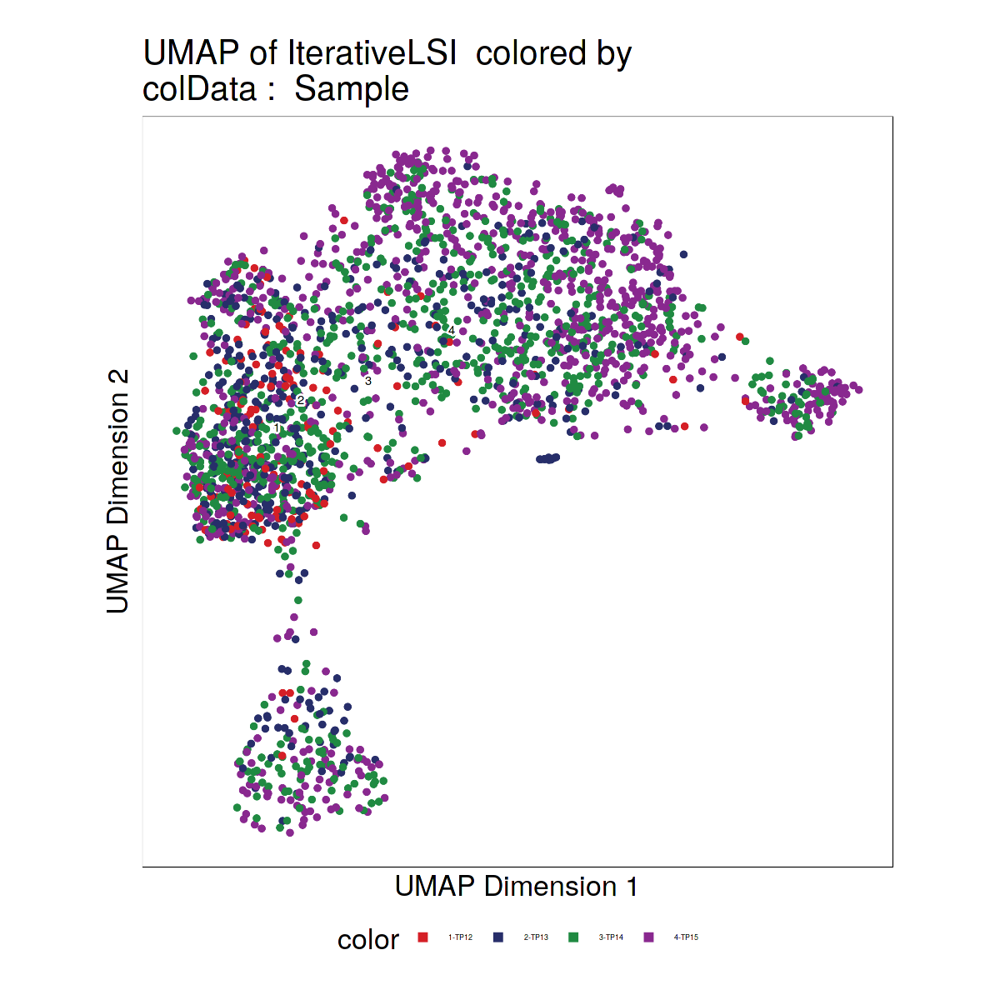

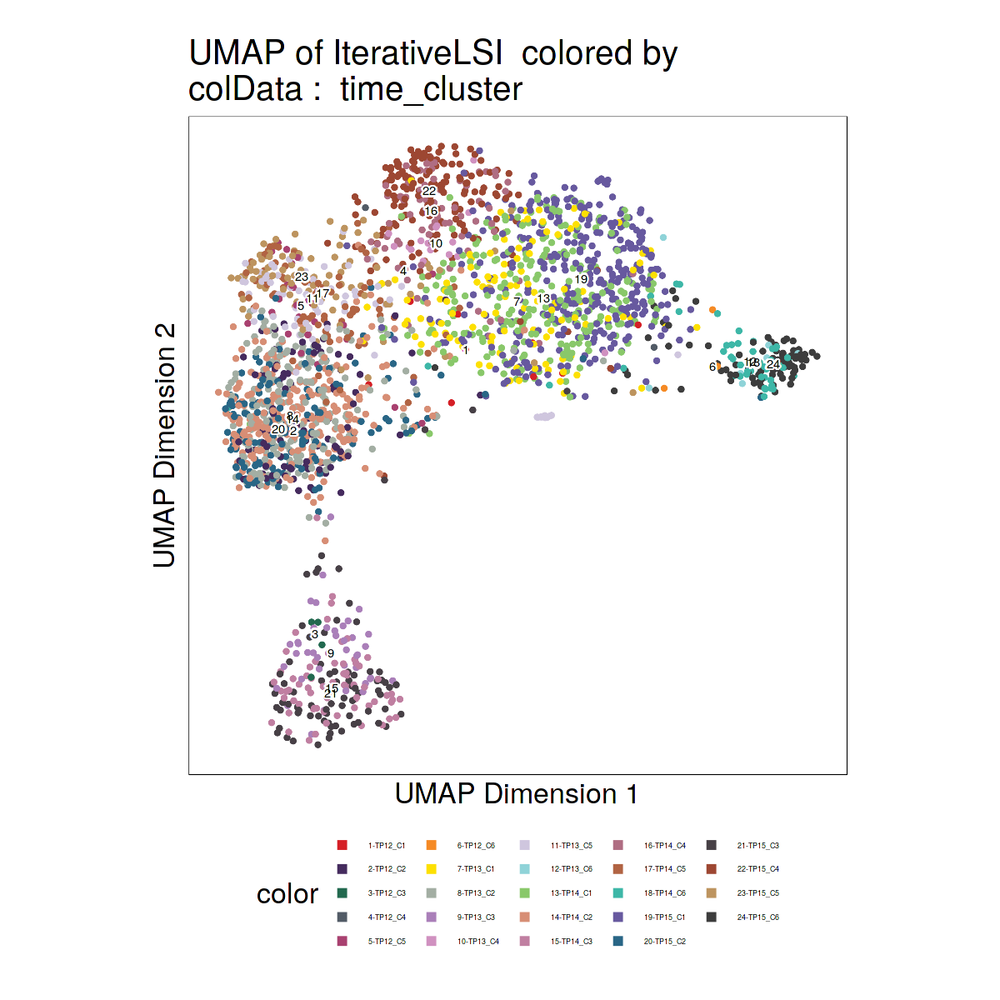

In [316]:
plotEmbedding(ArchRProj = Merged.proj2[Merged.proj2@cellColData$chrY > 0],embedding = "UMAP", colorBy ="cellColData", 
              name = c("chrY","cluster","Sample","time_cluster"),
              keepAxis = FALSE,
              
              plotAs = "points",
                 quantCut = c(0.0, 0.9),
              size=1.5,
       baseSize = 20)
plotEmbedding(ArchRProj = Merged.proj2[Merged.proj2@cellColData$chrY == 0],embedding = "UMAP", colorBy ="cellColData", 
              name = c("chrY","cluster","Sample","time_cluster"),
              keepAxis = FALSE,
              
              plotAs = "points",
                 quantCut = c(0.0, 0.9),
              size=1.5,
       baseSize = 20)

In [5]:
TP12.male.name <- Merged.proj2[Merged.proj2@cellColData$chrY > 1]@cellColData %>% as.data.frame %>% dplyr::filter(Sample=="TP12") %>% rownames
TP13.male.name <- Merged.proj2[Merged.proj2@cellColData$chrY > 1]@cellColData %>% as.data.frame %>% dplyr::filter(Sample=="TP13") %>% rownames
TP14.male.name <- Merged.proj2[Merged.proj2@cellColData$chrY > 1]@cellColData %>% as.data.frame %>% dplyr::filter(Sample=="TP14") %>% rownames
TP15.male.name <- Merged.proj2[Merged.proj2@cellColData$chrY > 1]@cellColData %>% as.data.frame %>% dplyr::filter(Sample=="TP15") %>% rownames

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!



In [25]:
TP12.male.umap <- plotEmbedding(ArchRProj = Merged.proj2[Merged.proj2@cellColData$chrY > 1],embedding = "UMAP", colorBy ="cellColData", 
              name = c("cluster"),
              keepAxis = FALSE,highlightCells = TP12.male.name, randomize = FALSE,
              plotAs = "points",
#                  quantCut = c(0.0, 0.9),
              size=1,
       baseSize = 10)
TP13.male.umap <- plotEmbedding(ArchRProj = Merged.proj2[Merged.proj2@cellColData$chrY > 1],embedding = "UMAP", colorBy ="cellColData", 
              name = c("cluster"),
              keepAxis = FALSE,highlightCells = TP13.male.name, randomize = FALSE,
              plotAs = "points",
#                  quantCut = c(0.0, 0.9),
              size=1,
       baseSize = 10)
TP14.male.umap <- plotEmbedding(ArchRProj = Merged.proj2[Merged.proj2@cellColData$chrY > 1],embedding = "UMAP", colorBy ="cellColData", 
              name = c("cluster"),
              keepAxis = FALSE,highlightCells = TP14.male.name, randomize = FALSE,
              plotAs = "points",
#                  quantCut = c(0.0, 0.9),
              size=1,
       baseSize = 10)
TP15.male.umap <- plotEmbedding(ArchRProj = Merged.proj2[Merged.proj2@cellColData$chrY > 1],embedding = "UMAP", colorBy ="cellColData", 
              name = c("cluster"),
              keepAxis = FALSE,highlightCells = TP15.male.name, randomize = FALSE,
              plotAs = "points",
#                  quantCut = c(0.0, 0.9),
              size=1,
       baseSize = 10)




Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-d9ed7d96ac3-Date-2022-08-30_Time-11-29-43.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-d9ed7d96ac3-Date-2022-08-30_Time-11-29-43.log

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-d9ed7935f49c-Date-2022-08-30_Time-11-29-45.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-d9ed7935f49c-Date-2022-08-30_Time-11-29-45.log

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-plotEm

In [30]:
pdf("./2022Figure/Male.supporting.time.sep.umap.pdf",width=10,height=5)
TP12.male.umap
TP13.male.umap
TP14.male.umap
TP15.male.umap
dev.off()

png 
  2

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d416b3f7ab3-Date-2022-01-03_Time-14-30-33.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d416b3f7ab3-Date-2022-01-03_Time-14-30-33.log



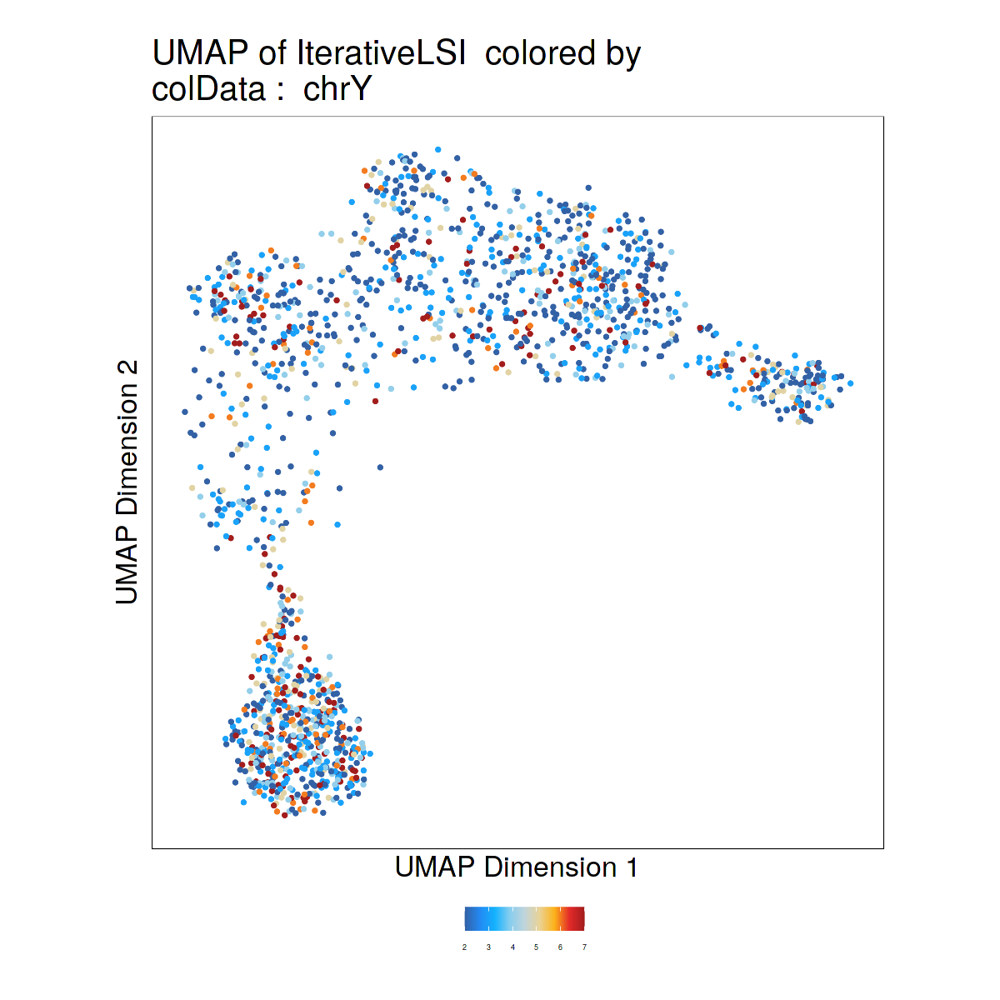

$chrY

$cluster

$Sample


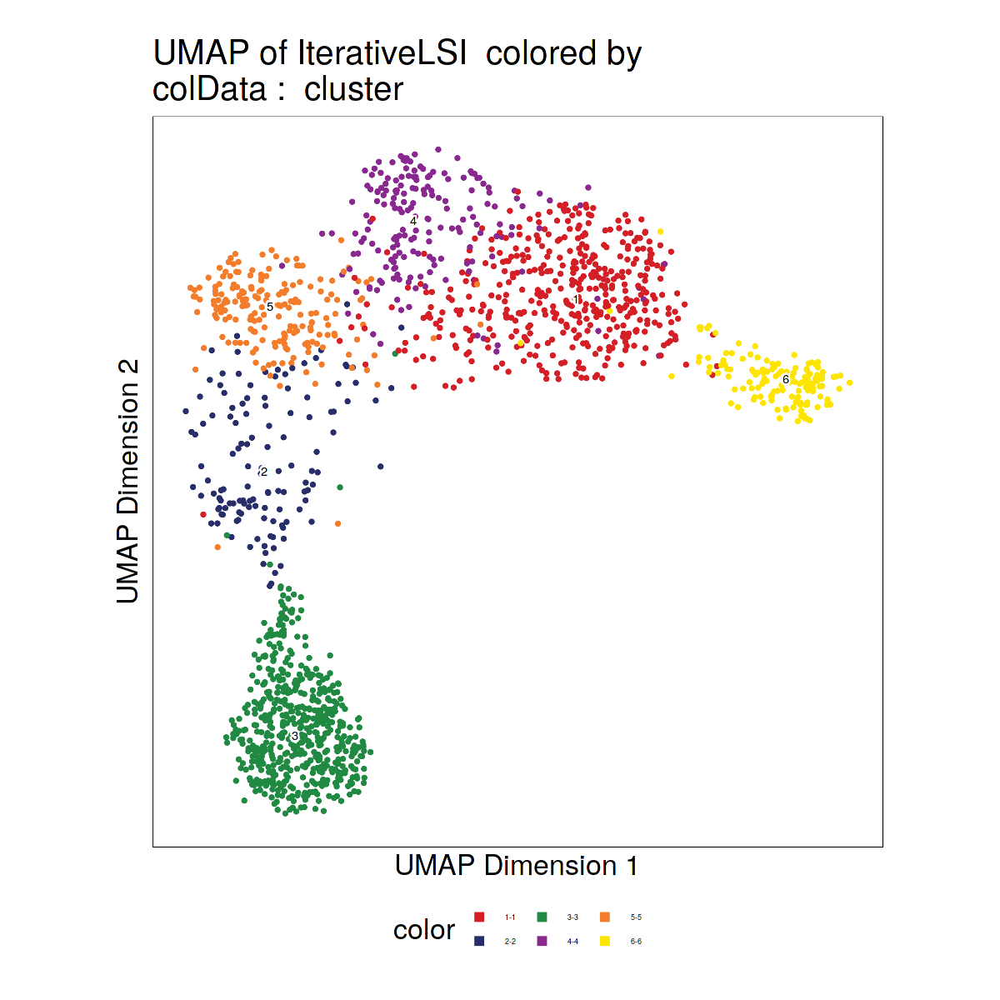

$chrY

$cluster

$Sample


png 
  2

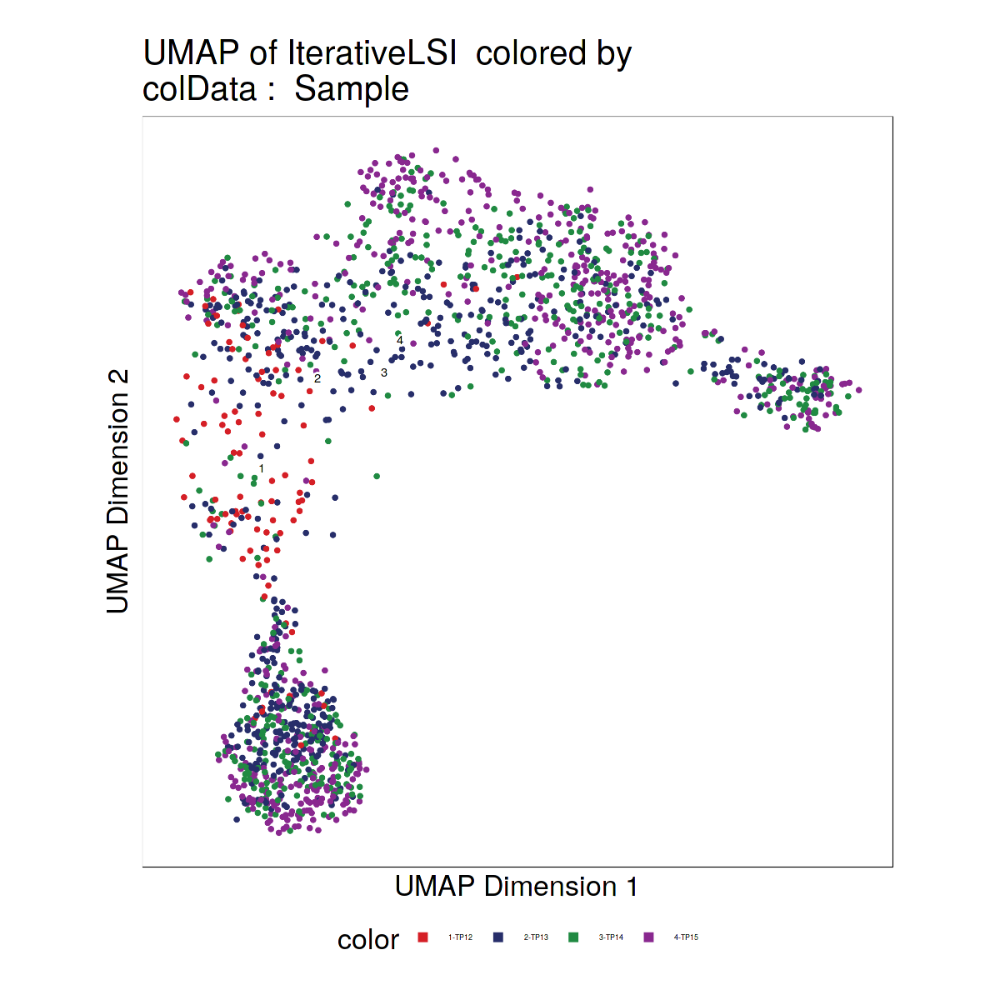

In [186]:
options(repr.plot.width=10,repr.plot.height=10)
p <- plotEmbedding(ArchRProj = Merged.proj2[Merged.proj2@cellColData$chrY > 1],embedding = "UMAP", colorBy ="cellColData", 
              name = c("chrY","cluster","Sample"),
              keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0.0, 0.9),
              size=1,
       baseSize = 20)
p
pdf(file="./2022Figure/202201.male.somatic.UMAP.pdf")
p
dev.off()



In [6]:
Merged.proj.male <- Merged.proj2[Merged.proj2@cellColData$chrY > 1]

Merged.proj.male <- addImputeWeights(Merged.proj.male,k=15,ka=4,td=3,sampleCells = 5000,reducedDims = "IterativeLSI")

Merged.proj.male@cellColData$time_cluster[Merged.proj.male@cellColData$time_cluster %in% c("TP12_C2", "TP13_C2", "TP14_C2","TP15_C2")] = "TPall_C2" 

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-1369d43a504-Date-2023-04-20_Time-19-29-08.log
If there is an issue, please report to github with logFile!

2023-04-20 19:29:09 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-136937e0b9e5-Date-2023-04-20_Time-19-29-48.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-136937e0b9e5-Date-2023-04-20_Time-19-29-48.log



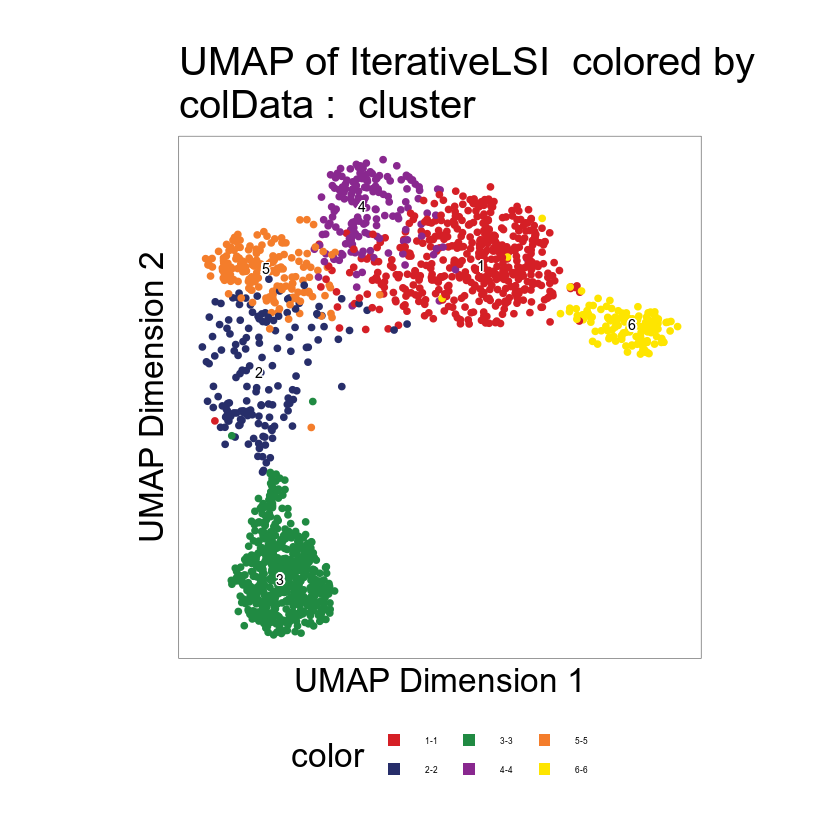

In [9]:
plotEmbedding(ArchRProj = Merged.proj.male,embedding = "UMAP", colorBy ="cellColData", 
              name = c("cluster"),
              keepAxis = FALSE,
              
              plotAs = "points",
                 quantCut = c(0.0, 0.9),
              size=1.5,
       baseSize = 20)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d414f85c959-Date-2022-01-18_Time-10-22-00.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d414f85c959-Date-2022-01-18_Time-10-22-00.log



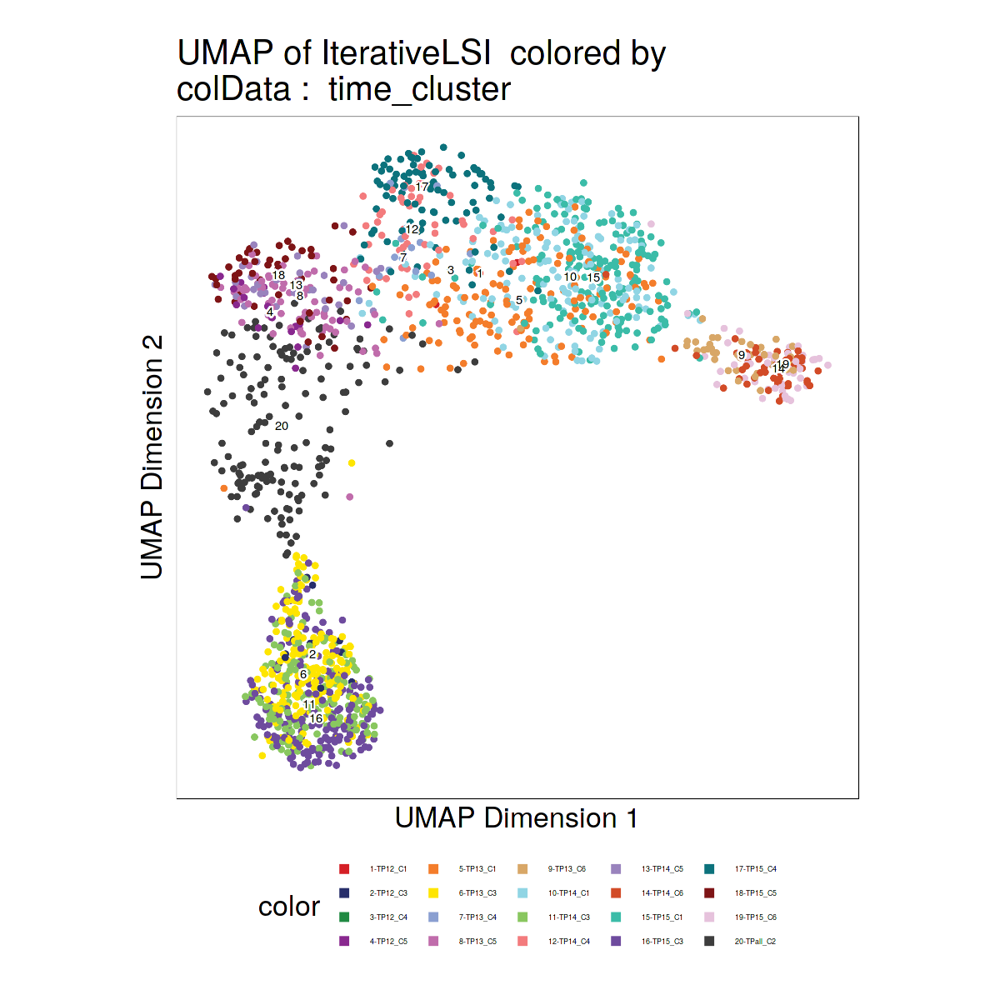

In [318]:
plotEmbedding(ArchRProj = Merged.proj.male,embedding = "UMAP", colorBy ="cellColData", 
              name = c("time_cluster"),
              keepAxis = FALSE,
              
              plotAs = "points",
                 quantCut = c(0.0, 0.9),
              size=1.5,
       baseSize = 20)

In [10]:
# Major gran
# Major.trajectory <- c("TP12_C2", "TP13_C2", "TP14_C2","TP15_C2",)
Major.trajectory <- c("TP12_C5","TPall_C2","TP12_C3","TP13_C3","TP14_C3","TP15_C3")
Merged.proj.male <- addTrajectory(
     ArchRProj = Merged.proj.male, 
     name = "Major_trajectory", 
     groupBy = "time_cluster",
     trajectory = Major.trajectory, 
     embedding = "UMAP", 
     force = TRUE
 )



ArchR logging to : ArchRLogs/ArchR-addTrajectory-1369454a04c6-Date-2023-04-20_Time-19-30-46.log
If there is an issue, please report to github with logFile!

Filtering outliers

Initial Alignment Before Spline Fit

Spline Fit

KNN to Spline

ArchR logging successful to : ArchRLogs/ArchR-addTrajectory-1369454a04c6-Date-2023-04-20_Time-19-30-46.log



ArchR logging to : ArchRLogs/ArchR-plotTrajectory-13693a47ab89-Date-2023-04-20_Time-19-30-52.log
If there is an issue, please report to github with logFile!

Plotting


Plotting Trajectory


Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-13693a47ab89-Date-2023-04-20_Time-19-30-52.log

Warning message:
“Removed 988 rows containing non-finite values (`stat_summary_hex()`).”


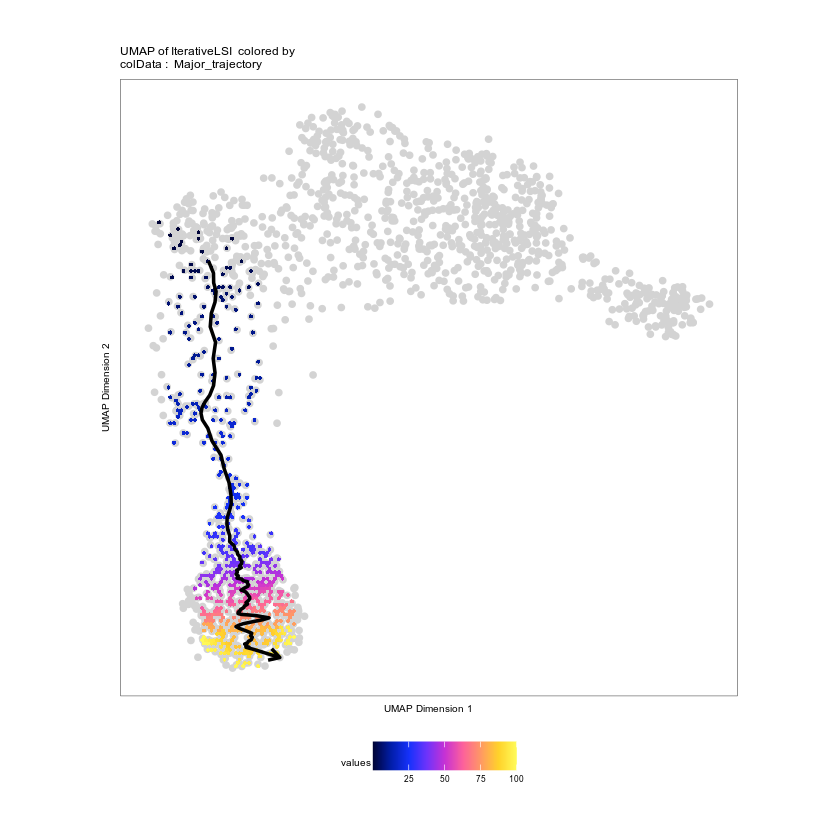

In [11]:
p <- plotTrajectory(Merged.proj.male, trajectory = "Major_trajectory", colorBy = "cellColData", name = "Major_trajectory")
p[[1]]
p.2 <- plotTrajectory(Merged.proj2, trajectory = "Minor_trajectory", colorBy = "cellColData", name = "Minor_trajectory")
p.2[[1]]
pdf(file="./2022Figure/202201.sertoli.trajectory.pdf")
p[[1]]
dev.off()

In [220]:
Merged.proj.female <- Merged.proj2[Merged.proj2@cellColData$chrY == 0]
Merged.proj.female@cellColData$time_cluster[Merged.proj.female@cellColData$time_cluster %in% c("TP12_C2", "TP13_C2", "TP14_C2","TP15_C2")] = "TPall_C2" 
Merged.proj.female <- addImputeWeights(Merged.proj.female,k=15,ka=4,td=3,sampleCells = 5000,reducedDims = "IterativeLSI")

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-5d411f9acdc0-Date-2022-01-03_Time-15-33-36.log
If there is an issue, please report to github with logFile!

2022-01-03 15:33:36 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d4110f97f92-Date-2022-01-03_Time-15-36-20.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..

2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d4110f97f92-Date-2022-01-03_Time-15-36-20.log



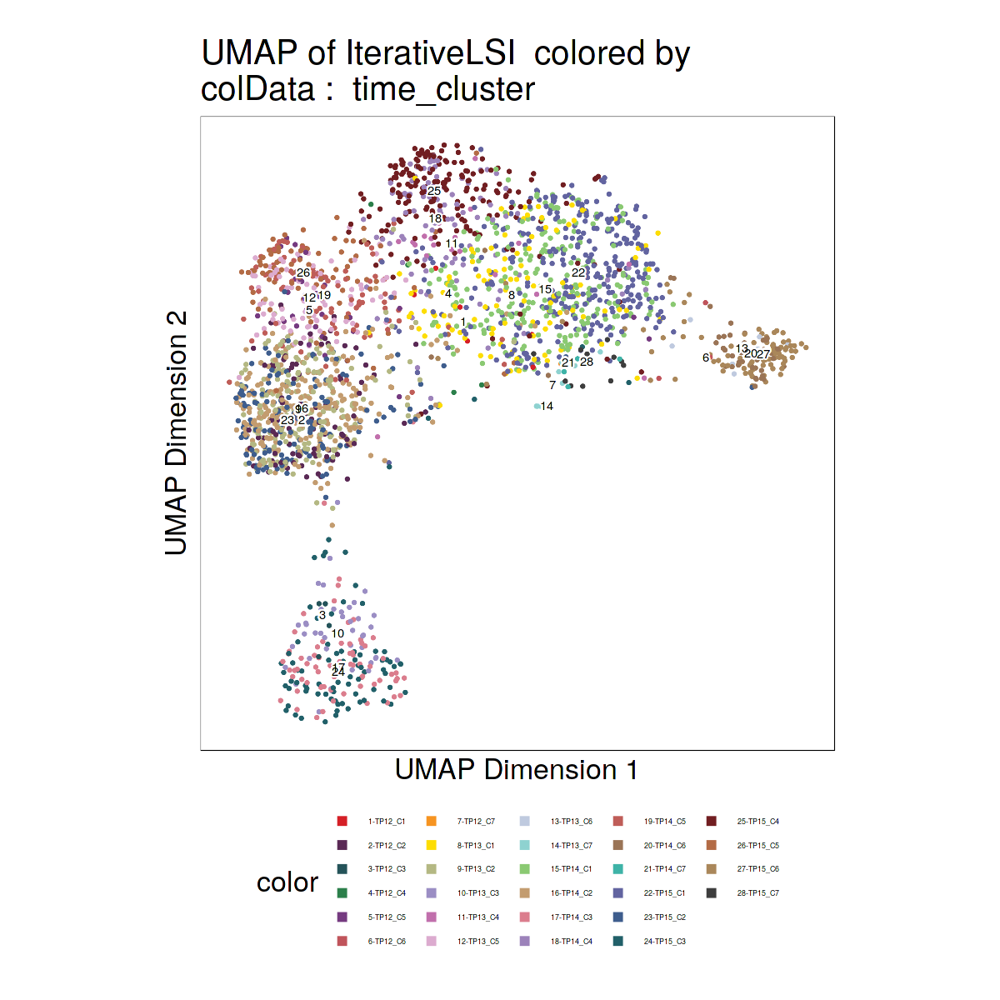

$time_cluster

$cluster

$Sample


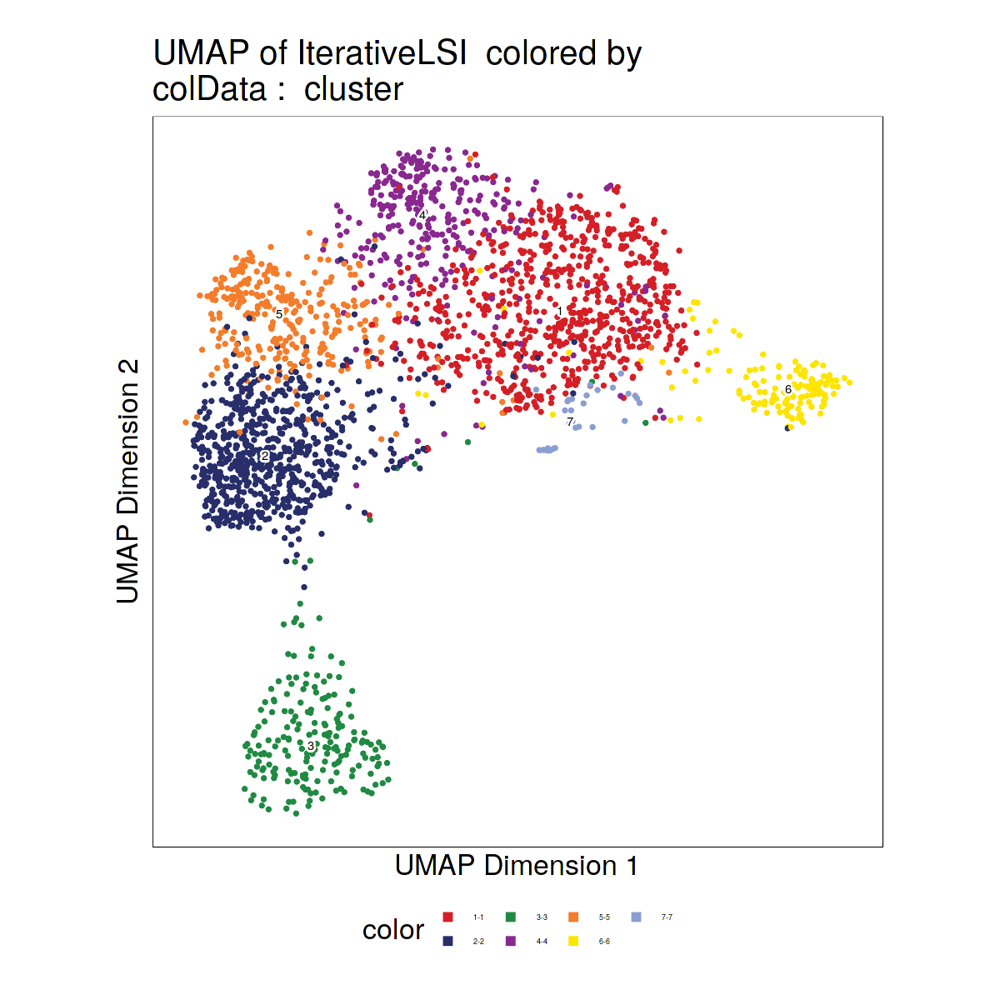

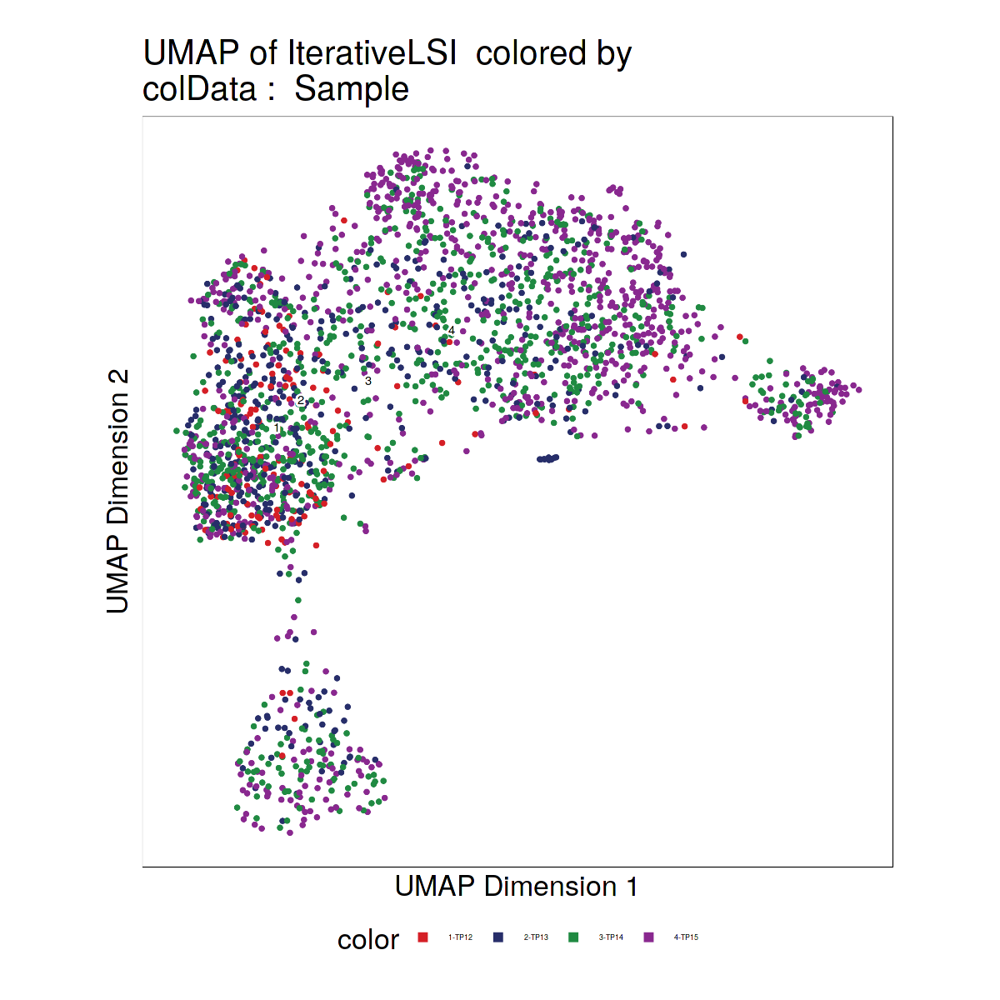

In [223]:
plotEmbedding(ArchRProj = Merged.proj2[Merged.proj2@cellColData$chrY == 0],embedding = "UMAP", colorBy ="cellColData", 
              name = c("time_cluster","cluster","Sample"),
              keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0.0, 0.9),
              size=1,
       baseSize = 20)

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-1369285cea7f-Date-2023-04-20_Time-19-32-31.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-1369285cea7f-Date-2023-04-20_Time-19-32-31.log



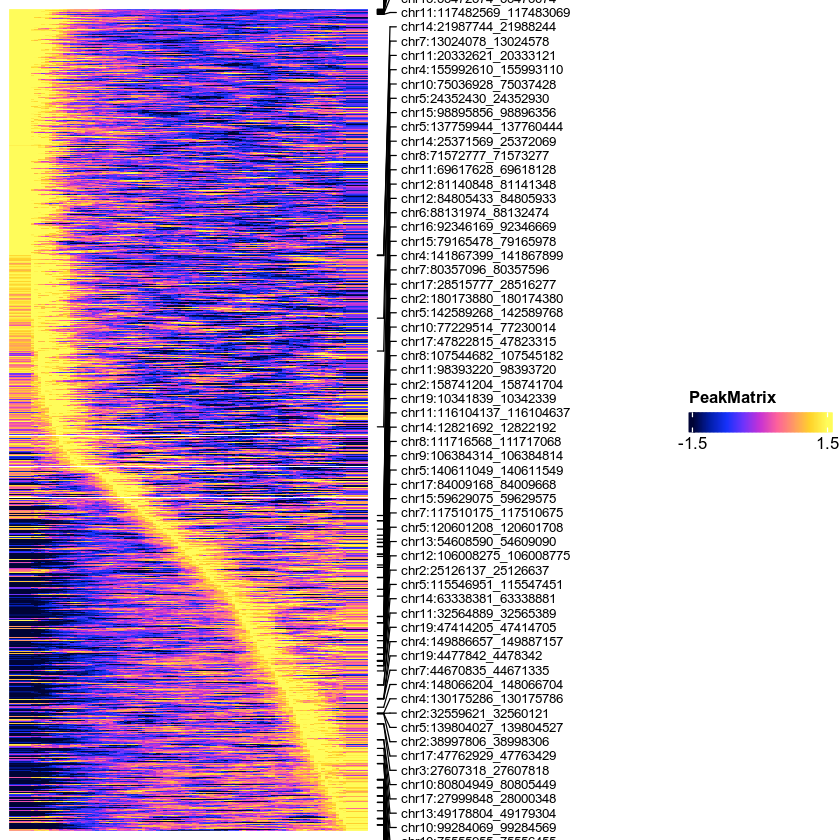

In [12]:
trajPM  <- getTrajectory(ArchRProj = Merged.proj.male, name = "Major_trajectory", useMatrix = "PeakMatrix", log2Norm = TRUE)
p0 <- plotTrajectoryHeatmap(trajPM, returnMatrix = FALSE, pal = paletteContinuous(set = "horizonExtra"),labelTop = 100,varCutOff = 0.975)
p0

In [2]:
p0.df <- plotTrajectoryHeatmap(trajPM, returnMatrix = TRUE, scaleRows = TRUE, pal = paletteContinuous(set = "horizonExtra"),labelTop = 100,varCutOff = 0.95)
p0.df %>% as.data.frame()%>% write.csv("sertoli_time_peak.cor0.95.csv")

In [366]:
p0.df$region <- rownames(p0.df)

In [379]:
p0.anno <- p0.df %>% separate(region,c("chr","region"), sep= ":" ) %>% separate(region,c("start","end"), sep= "_" ) %>%
dplyr::select("chr","start","end") %>% makeGRangesFromDataFrame(keep.extra.columns=TRUE,
                         ignore.strand=FALSE,
                         seqnames.field="chr",start.field = "start",end.field="end") %>% 
annotatePeak(TxDb=txdb,
                       tssRegion=c(-1000, 1000), verbose=FALSE,annoDb="org.Mm.eg.db")

'select()' returned 1:many mapping between keys and columns



In [393]:
cbind(attributes(p0.anno)$anno %>% as.data.frame,p0.df[1:100]) %>% write.csv("sertoli_time_peak.cor0.95.csv")

In [394]:
attributes(p0.anno)$anno %>% as.data.frame %>%  filter(annotation == "Distal Intergenic") %>% pull(SYMBOL)

[1] "Serpinh1"      "Hspb1"         "Msx2"          "A530013C23Rik"
  [5] "Egr3"          "Comtd1"        "Tnrc18"        "Mir7078"      
  [9] "Zfp503"        "Igf2bp3"       "Myl7"          "Cstad"        
 [13] "Sik1"          "9430078K24Rik" "Nr4a1"         "Hey1"         
 [17] "Foxo6"         "Mib1"          "Gpr161"        "Gm38404"      
 [21] "Lncppara"      "Prr5"          "Adgrl1"        "Hmga2"        
 [25] "Zfp503"        "Crabp2"        "Nsd1"          "Dlk1"         
 [29] "Rybp"          "Cript"         "Pcdh1"         "Arid1b"       
 [33] "Tbl1xr1"       "Pou2f1"        "Hoxc4"         "Ppp1r26"      
 [37] "Gm32123"       "9430078K24Rik" "E130006D01Rik" "Hand1"        
 [41] "Mir3089"       "Id1"           "Kdm5b"         "Nfam1"        
 [45] "Col6a3"        "Hmga2"         "C130026L21Rik" "Npas4"        
 [49] "Lrrn4"         "Id2"           "1700021F07Rik" "Krt8"         
 [53] "Wnt11"         "Zfp382"        "Synpo"         "Eif4e"        
 [57] "Asic1"         "Irf2bpl"       "Atp23"         "Klf10"        
 [61] "Zbtb8a"        "Adgrl1"        "Tgfbi"         "Capg"         
 [65] "Zfp703"        "Alox5ap"       "Calcoco1"      "E030018B13Rik"
 [69] "Wnt11"         "Ski"           "Nkx6-2"        "Lrrc18"       
 [73] "Nkd1"          "Top1"          "Rgs3"          "Ndufb4"       
 [77] "Cops8"         "Emp1"          "Lef1"          "Gm11729"      
 [81] "Zfp692"        "Kif26a"        "2700089I24Rik" "Tns3"         
 [85] "Col1a1"        "4933422A05Rik" "Rbp7"          "1600014C10Rik"
 [89] "Eif4g3"        "Ccnd1"         "Mir6380"       "5730409E04Rik"
 [93] "Mir6417"       "Gm525"         "Trim8"         "Ccne1"        
 [97] "Arhgap32"      "Btn2a2"        "Socs3"         "Myl3"         
[101] "Fos"           "S1pr3"         "Ccdc42"        "Sik1"         
[105] "Srl"           "Opa1"          "5830454E08Rik" "Krt19"        
[109] "Ptma"          "Gm14486"       "Ezr"           "Arc"          
[113] "4933411E08Rik" "Snord12"       "Lmo4"          "Ptma"         
[117] "Tcf15"         "Ptma"          "Fos"           "Hoxc4"        
[121] "Gm20744"       "Tob1"          "Gm5084"        "A530065N20Rik"
[125] "Lingo1"        "Fam170b"       "Cep170b"       "Creg1"        
[129] "Krt19"         "Mir3089"       "Sncaip"        "Selenok"      
[133] "Mki67"         "Tob2"          "Rybp"          "Arid2"        
[137] "Irf2bp2"       "1810026B05Rik" "Id3"           "Hmox1"        
[141] "Castor2"       "Myh9"          "Tac4"          "Ptma"         
[145] "Irf2bp2"       "Edn2"          "Lsamp"         "Mef2d"        
[149] "Gprc5c"        "Dmbx1"         "Tmem120b"      "1700073E17Rik"
[153] "Ntm"           "Stard10"       "Eif2s3x"       "Egr1"         
[157] "Ccnd1"         "Syf2"          "Soat1"         "Bsn"          
[161] "Atp10a"        "Mdk"           "Ppp2r3d"       "1810026B05Rik"
[165] "Trpm1"         "Rdm1"          "Dus3l"         "Zfp983"       
[169] "Shank2"        "Chd7"          "Mir23a"        "1810010H24Rik"
[173] "Hlf"           "Ubc"           "Nr4a3"         "Cpn2"         
[177] "Rhbdl3"        "Emx2"          "Tnrc18"        "Hcfc1"        
[181] "C230035I16Rik" "Gjb5"          "Rpp25"         "Ago2"         
[185] "Srsf9"         "Comtd1"        "Scrt2"         "Grb7"         
[189] "Tnrc18"        "Msx1"          "Mirt1"         "Nrp1"         
[193] "Enah"          "Syf2"          "Gm833"         "Yy1"          
[197] "Sf3a3"         "Sertad1"       "Npr1"          "Tmem174"      
[201] "Drd5"          "Sos1"          "Bcor"          "Map1b"        
[205] "Mos"           "Gjb5"          "Atf6b"         "Fos"          
[209] "Bvht"          "Camk2n1"       "Rbbp8"         "Shf"          
[213] "Ccne1"         "Prss38"        "Actg1"         "Mical3"       
[217] "Zfp395"        "Slc25a5"       "Copz2"         "Ddx25"        
[221] "Chst14"        "Pdpk1"         "Zkscan3"       "Hmces"        
[225] "Fam167b"       "Hfm1"          "Spsb2"         "L1td1"        
[229] "17000

In [351]:
library(pheatmap)
p0.df %>% pheatmap(cluster_rows = FALSE,
       cluster_cols = FALSE,
               border_color = FALSE,
         width = 5, height = 10,fontsize = 8,labels_row =c ("chr11:112770416_112770916","chr11:112850000_112850500",
                                                             "chr11:112802772_112803272"),
                filename = "./2022Figure/202112.sertoli.time.PM.cor0.95.pdf"
               )

In [352]:
library(pheatmap)
p0.df %>% pheatmap(cluster_rows = FALSE,
       cluster_cols = FALSE,
               border_color = FALSE,
         width = 5, height = 10,fontsize = 8,labels_row =c ("chr11:112770416_112770916","chr11:112850000_112850500",
                                                             "chr11:112802772_112803272"),
                filename = "./2022Figure/202112.sertoli.time.PM.cor0.95.png"
               )

In [3]:
Merged.proj.male <- saveArchRProject(Merged.proj.male,outputDirectory = "./Merged.proj.male.2023", load = TRUE)

In [6]:
Merged.proj.male <- loadArchRProject("./Merged.proj.male.2023/",force = TRUE)

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [7]:
Merged.proj.male


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /lustre/home/jasonliao/teaching_server/sex_differentiation/Merged.proj.male.2023 
samples(4): TP15 TP14 TP13 TP12
sampleColData names(1): ArrowFiles
cellColData names(66): Sample TSSEnrichment ... time_cluster
  Major_trajectory
numberOfCells(1): 1635
medianTSS(1): 19.427
medianFrags(1): 13437

In [5]:
Merged.proj.male <- addMotifAnnotations(ArchRProj = Merged.proj.male, motifSet = "cisbp", name = "Motif",force = TRUE)

Warning message:
“package ‘motifmatchr’ was built under R version 4.2.2”
ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-8560ed2ae48-Date-2023-04-20_Time-20-14-47.log
If there is an issue, please report to github with logFile!

2023-04-20 20:14:52 : Getting Motif Set, Species : Mus musculus, 0.008 mins elapsed.

Using version 2 motifs!

2023-04-20 20:14:57 : Finding Motif Positions with motifmatchr!, 0.094 mins elapsed.

2023-04-20 20:18:01 : All Motifs Overlap at least 1 peak!, 3.161 mins elapsed.

2023-04-20 20:18:02 : Creating Motif Overlap Matrix, 3.161 mins elapsed.

2023-04-20 20:18:04 : Finished Getting Motif Info!, 3.201 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-8560ed2ae48-Date-2023-04-20_Time-20-14-47.log



In [6]:
Merged.proj.male <- addBgdPeaks(Merged.proj.male,force = TRUE)
Merged.proj.male <- addDeviationsMatrix(
  ArchRProj = Merged.proj.male, 
  peakAnnotation = "Motif",
  force = TRUE
)

Identifying Background Peaks!

Using Previous Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-856034472cdc-Date-2023-04-20_Time-20-21-16.log
If there is an issue, please report to github with logFile!

2023-04-20 20:22:44 : Batch Execution w/ safelapply!, 0 mins elapsed.

Can not create group. Object with name 'MotifMatrix' already exists.

2023-04-20 20:22:46 : chromVAR deviations TP15 (1 of 4) Schep (2017), 0.027 mins elapsed.



TP15 (1 of 4) : Deviations for Annotation 89 of 884
TP15 (1 of 4) : Deviations for Annotation 177 of 884
TP15 (1 of 4) : Deviations for Annotation 265 of 884
TP15 (1 of 4) : Deviations for Annotation 353 of 884
TP15 (1 of 4) : Deviations for Annotation 441 of 884
TP15 (1 of 4) : Deviations for Annotation 529 of 884
TP15 (1 of 4) : Deviations for Annotation 617 of 884
TP15 (1 of 4) : Deviations for Annotation 705 of 884
TP15 (1 of 4) : Deviations for Annotation 793 of 884
TP15 (1 of 4) : Deviations for Annotation 881 of 884


2023-04-20 20:27:43 : Finished Computing Deviations!, 4.984 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2023-04-20 20:28:09 : chromVAR deviations TP14 (2 of 4) Schep (2017), 5.418 mins elapsed.



TP14 (2 of 4) : Deviations for Annotation 89 of 884
TP14 (2 of 4) : Deviations for Annotation 177 of 884
TP14 (2 of 4) : Deviations for Annotation 265 of 884
TP14 (2 of 4) : Deviations for Annotation 353 of 884
TP14 (2 of 4) : Deviations for Annotation 441 of 884
TP14 (2 of 4) : Deviations for Annotation 529 of 884
TP14 (2 of 4) : Deviations for Annotation 617 of 884
TP14 (2 of 4) : Deviations for Annotation 705 of 884
TP14 (2 of 4) : Deviations for Annotation 793 of 884
TP14 (2 of 4) : Deviations for Annotation 881 of 884


2023-04-20 20:31:44 : Finished Computing Deviations!, 8.997 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2023-04-20 20:32:10 : chromVAR deviations TP13 (3 of 4) Schep (2017), 9.435 mins elapsed.



TP13 (3 of 4) : Deviations for Annotation 89 of 884
TP13 (3 of 4) : Deviations for Annotation 177 of 884
TP13 (3 of 4) : Deviations for Annotation 265 of 884
TP13 (3 of 4) : Deviations for Annotation 353 of 884
TP13 (3 of 4) : Deviations for Annotation 441 of 884
TP13 (3 of 4) : Deviations for Annotation 529 of 884
TP13 (3 of 4) : Deviations for Annotation 617 of 884
TP13 (3 of 4) : Deviations for Annotation 705 of 884
TP13 (3 of 4) : Deviations for Annotation 793 of 884
TP13 (3 of 4) : Deviations for Annotation 881 of 884


2023-04-20 20:36:40 : Finished Computing Deviations!, 13.931 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2023-04-20 20:37:04 : chromVAR deviations TP12 (4 of 4) Schep (2017), 14.338 mins elapsed.



TP12 (4 of 4) : Deviations for Annotation 89 of 884
TP12 (4 of 4) : Deviations for Annotation 177 of 884
TP12 (4 of 4) : Deviations for Annotation 265 of 884
TP12 (4 of 4) : Deviations for Annotation 353 of 884
TP12 (4 of 4) : Deviations for Annotation 441 of 884
TP12 (4 of 4) : Deviations for Annotation 529 of 884
TP12 (4 of 4) : Deviations for Annotation 617 of 884
TP12 (4 of 4) : Deviations for Annotation 705 of 884
TP12 (4 of 4) : Deviations for Annotation 793 of 884
TP12 (4 of 4) : Deviations for Annotation 881 of 884


2023-04-20 20:38:56 : Finished Computing Deviations!, 16.199 mins elapsed.

###########
2023-04-20 20:38:56 : Completed Computing Deviations!, 17.666 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-addDeviationsMatrix-856034472cdc-Date-2023-04-20_Time-20-21-16.log



Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-2f5c63bea0fb-Date-2023-07-15_Time-11-05-13.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-2f5c63bea0fb-Date-2023-07-15_Time-11-05-13.log



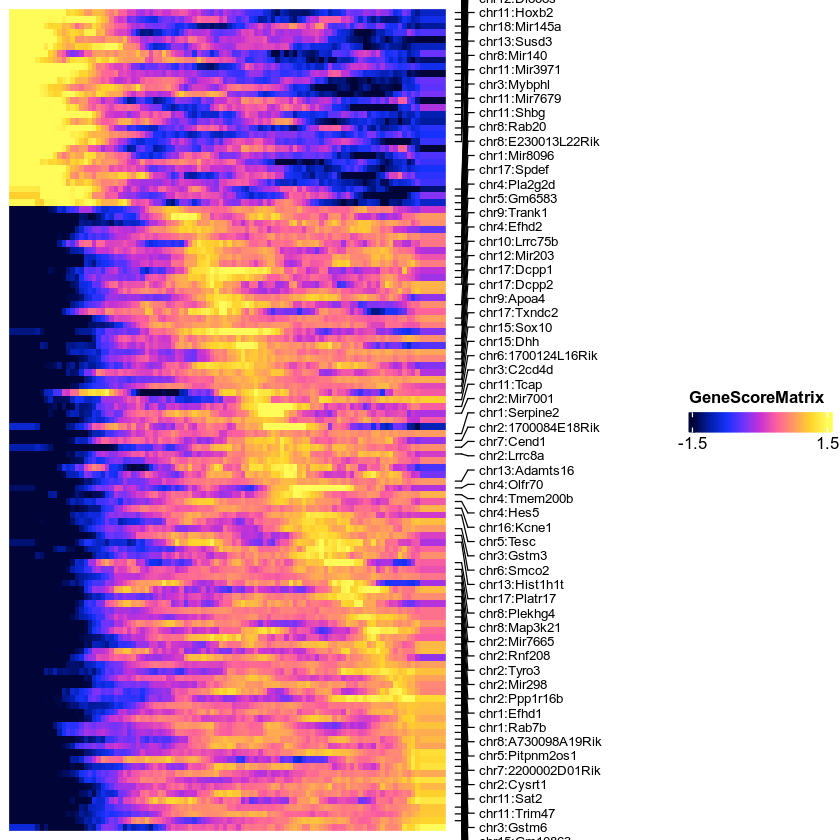

In [9]:
# new 
trajGSM <- getTrajectory(ArchRProj = Merged.proj.male, name = "Major_trajectory", useMatrix = "GeneScoreMatrix", log2Norm = TRUE,
scaleTo = NULL
)
p2 <- plotTrajectoryHeatmap(trajGSM,  pal = paletteContinuous(set = "horizonExtra"),labelTop = 100,varCutOff = 0.995, returnMatrix = FALSE)
p2

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-2f5c2a434488-Date-2023-07-15_Time-11-02-10.log
If there is an issue, please report to github with logFile!

useSeqnames is NULL or greater than 1 with a Sparse.Assays.Matrix trajectory input.

2023-07-15 11:02:11 : 

force=FALSE thus continuing with subsetting useSeqnames = z

2023-07-15 11:02:11 : 

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-2f5c2a434488-Date-2023-07-15_Time-11-02-10.log



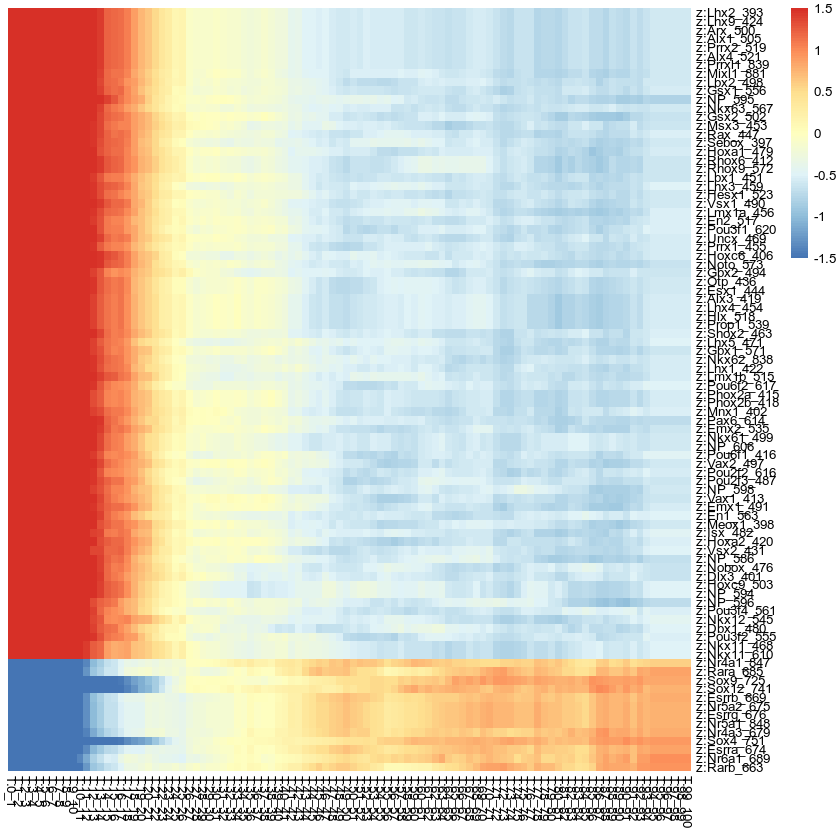

In [8]:
# new
trajMM  <- getTrajectory(ArchRProj = Merged.proj.male, name = "Major_trajectory", useMatrix = "MotifMatrix", log2Norm = FALSE,scaleTo = NULL)
p1 <- plotTrajectoryHeatmap(trajMM, pal = paletteContinuous(set = "solarExtra"),labelTop = 100,labelRows = TRUE, 
                           returnMatrix = TRUE
                           )
library(pheatmap)
p1 %>% pheatmap(cluster_rows = FALSE,
       cluster_cols = FALSE,
               border_color = FALSE,
         width = 10, height = 12,fontsize = 8,
#                 filename = "./2022Figure/202112.sertoli.time.MM.pdf"
               )

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-8560600e261-Date-2023-04-20_Time-20-46-23.log
If there is an issue, please report to github with logFile!

useSeqnames is NULL or greater than 1 with a Sparse.Assays.Matrix trajectory input.

2023-04-20 20:46:23 : 

force=FALSE thus continuing with subsetting useSeqnames = z

2023-04-20 20:46:23 : 

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-8560600e261-Date-2023-04-20_Time-20-46-23.log



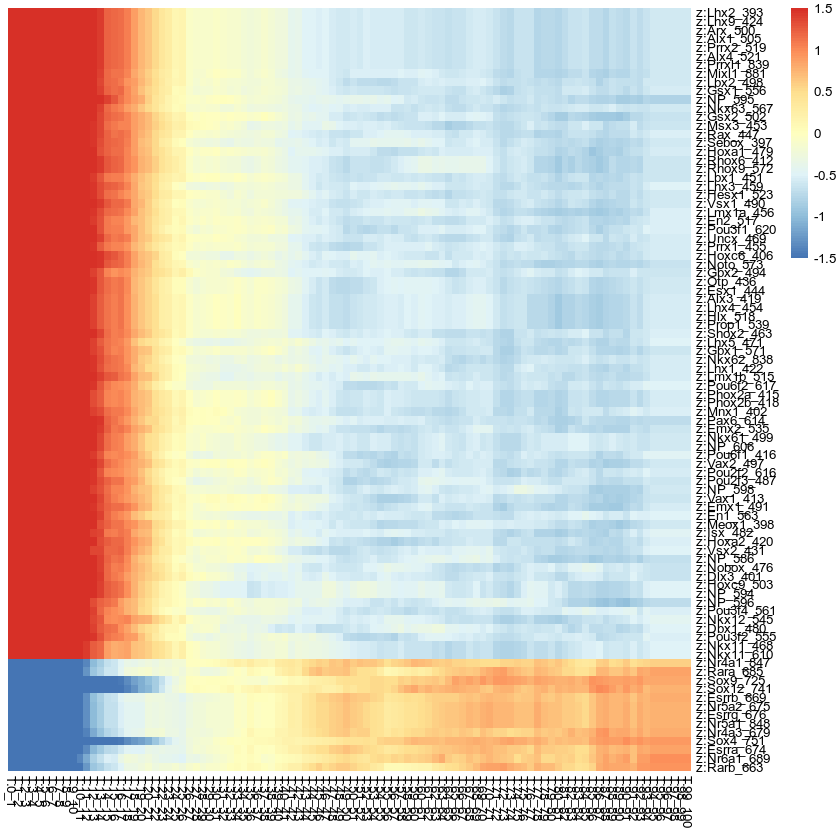

In [10]:
trajMM  <- getTrajectory(ArchRProj = Merged.proj.male, name = "Major_trajectory", useMatrix = "MotifMatrix", log2Norm = FALSE,scaleTo = NULL)
p1 <- plotTrajectoryHeatmap(trajMM, pal = paletteContinuous(set = "solarExtra"),labelTop = 100,labelRows = TRUE, 
                           returnMatrix = TRUE
                           )
library(pheatmap)
p1 %>% pheatmap(cluster_rows = FALSE,
       cluster_cols = FALSE,
               border_color = FALSE,
         width = 10, height = 12,fontsize = 8,
#                 filename = "./2022Figure/202112.sertoli.time.MM.pdf"
               )

In [ ]:
Merged.proj.male <- addImputeWeights(Merged.proj.male,k=15,ka=4,td=3,sampleCells = 5000,reducedDims = "IterativeLSI")


Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-85602d0ca51-Date-2023-04-20_Time-20-46-58.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2023-04-20 20:46:59 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting


Plotting Trajectory


Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-85602d0ca51-Date-2023-04-20_Time-20-46-58.log

Warning message:
“Removed 988 rows containing non-finite values (`stat_summary_hex()`).”
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


[[1]]

[[2]]


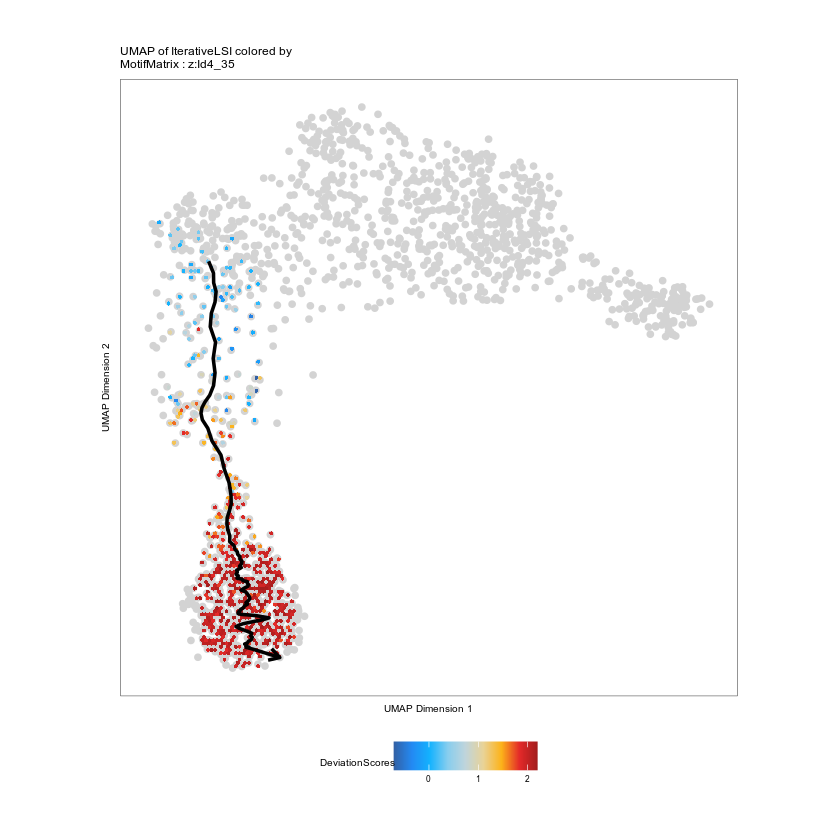

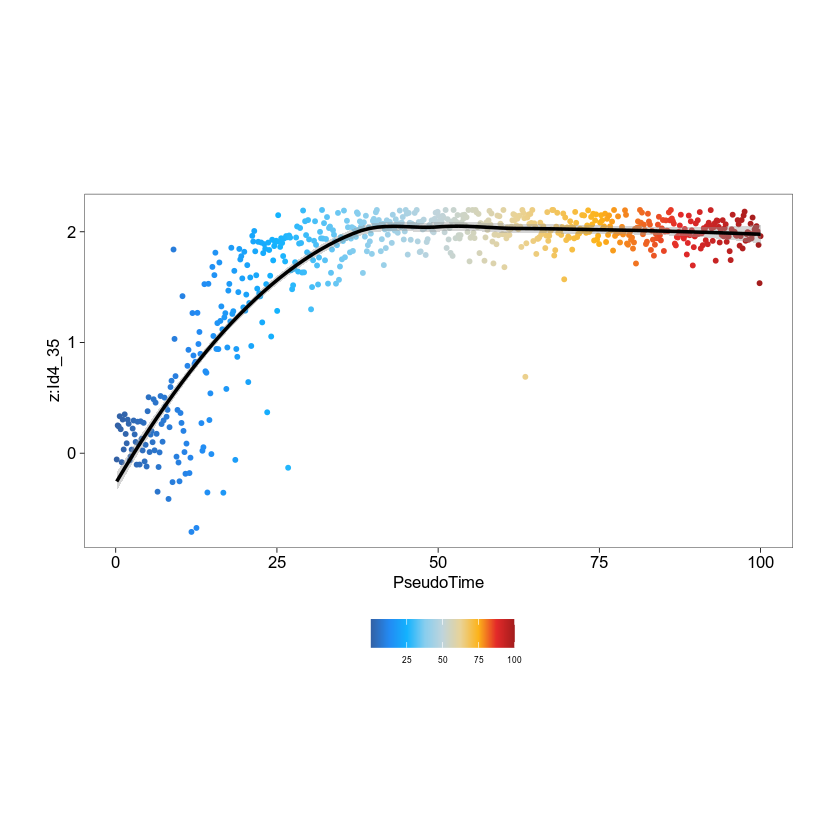

In [11]:
plotTrajectory(Merged.proj.male, trajectory = "Major_trajectory", 
                     colorBy = "MotifMatrix", name = "z:Id4_35", continuousSet = "solarExtra")

In [14]:
p1 <- plotTrajectory(Merged.proj.male, trajectory = "Major_trajectory", 
                     colorBy = "GeneScoreMatrix", name = c("Sox9"), continuousSet = "solarExtra",
                    quantCut = c(0.01, 0.99),
       quantHex = 0.5,
       discreteSet = NULL,
       continuousSet = NULL,
       randomize = TRUE,
       keepAxis = FALSE,
       baseSize = 6,
       addArrow = TRUE,
       plotAs = NULL,
       smoothWindow = 5)
p2 <- plotTrajectory(Merged.proj.male, trajectory = "Major_trajectory", 
                     colorBy = "GeneScoreMatrix", name = c("Sox10"), continuousSet = "solarExtra")
p3 <- plotTrajectory(Merged.proj.male, trajectory = "Major_trajectory", 
                     colorBy = "GeneScoreMatrix", name = c("Dhh"), continuousSet = "solarExtra")

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-2f5c7ae70007-Date-2023-07-15_Time-11-11-00.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2023-07-15 11:11:01 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting


Plotting Trajectory


Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-2f5c7ae70007-Date-2023-07-15_Time-11-11-00.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-2f5c5557b311-Date-2023-07-15_Time-11-11-08.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2023-07-15 11:11:09 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting


Plotting Trajectory


Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-2f5c5557b311-Date-2023-07-15_Time-11-11-08.log

Getting ImputeWeights

ArchR logging to : Arch

In [22]:
pdf("./2022Figure/sertoli.sox9.sox10.Dhh.GS.time.pdf")
p1
p2
p3
dev.off()

Warning message:
“Removed 988 rows containing non-finite values (`stat_summary_hex()`).”
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


[[1]]

[[2]]


Warning message:
“Removed 988 rows containing non-finite values (`stat_summary_hex()`).”
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


[[1]]

[[2]]


Warning message:
“Removed 988 rows containing non-finite values (`stat_summary_hex()`).”
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


[[1]]

[[2]]


png 
  2

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-856056e8b8fd-Date-2023-04-20_Time-20-51-09.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-856056e8b8fd-Date-2023-04-20_Time-20-51-09.log



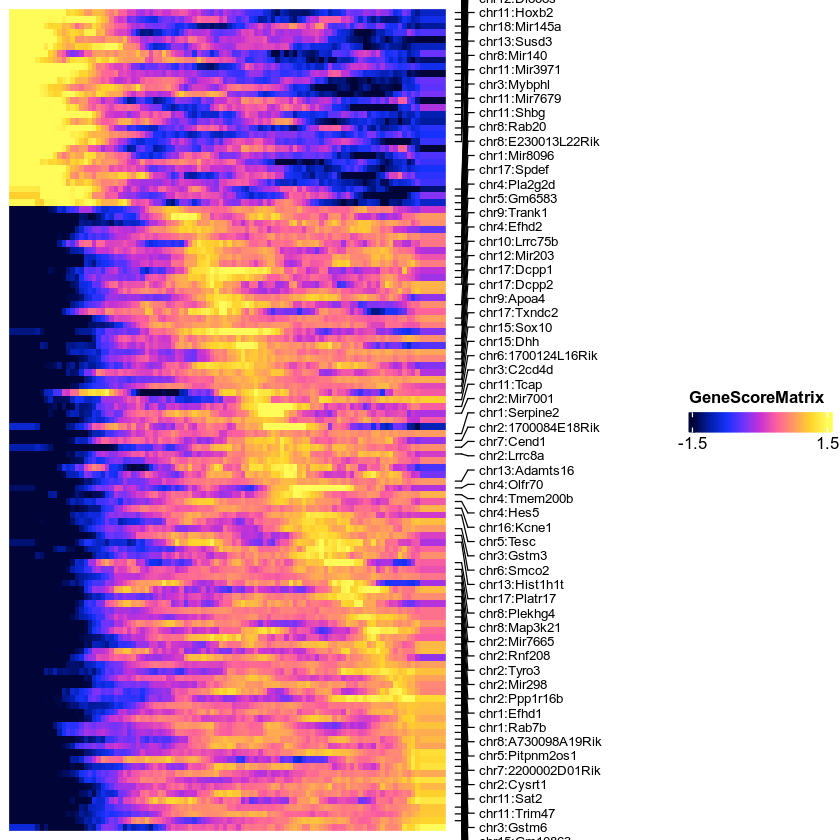

In [15]:
trajGSM <- getTrajectory(ArchRProj = Merged.proj.male, name = "Major_trajectory", useMatrix = "GeneScoreMatrix", log2Norm = TRUE,
scaleTo = NULL
)
p2 <- plotTrajectoryHeatmap(trajGSM,  pal = paletteContinuous(set = "horizonExtra"),labelTop = 100,varCutOff = 0.995, returnMatrix = FALSE)
p2

In [200]:
# p2 %>% pheatmap(cluster_rows = FALSE,
#        cluster_cols = FALSE,
#                border_color = FALSE,
#          width = 10, height = 15,fontsize = 8,
#                 filename = "./2022Figure/202112.sertoli.time.GSM.pdf"
#                )

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-85607238f2bc-Date-2023-04-20_Time-20-52-36.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2023-04-20 20:52:37 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting


Plotting Trajectory


Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-85607238f2bc-Date-2023-04-20_Time-20-52-36.log

Warning message:
“Removed 988 rows containing non-finite values (`stat_summary_hex()`).”
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


[[1]]

[[2]]


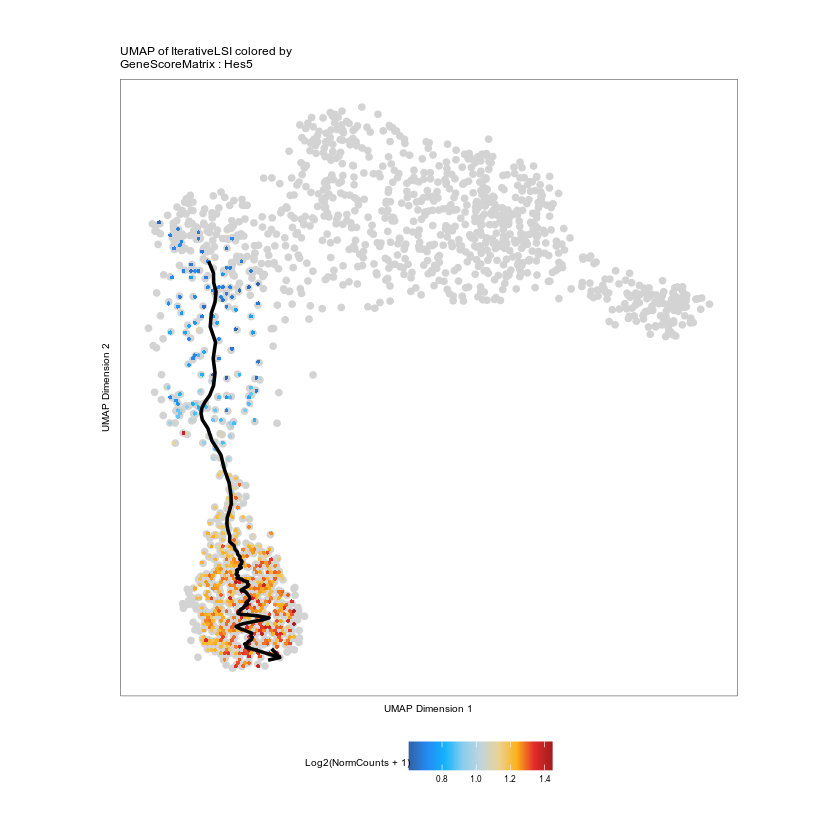

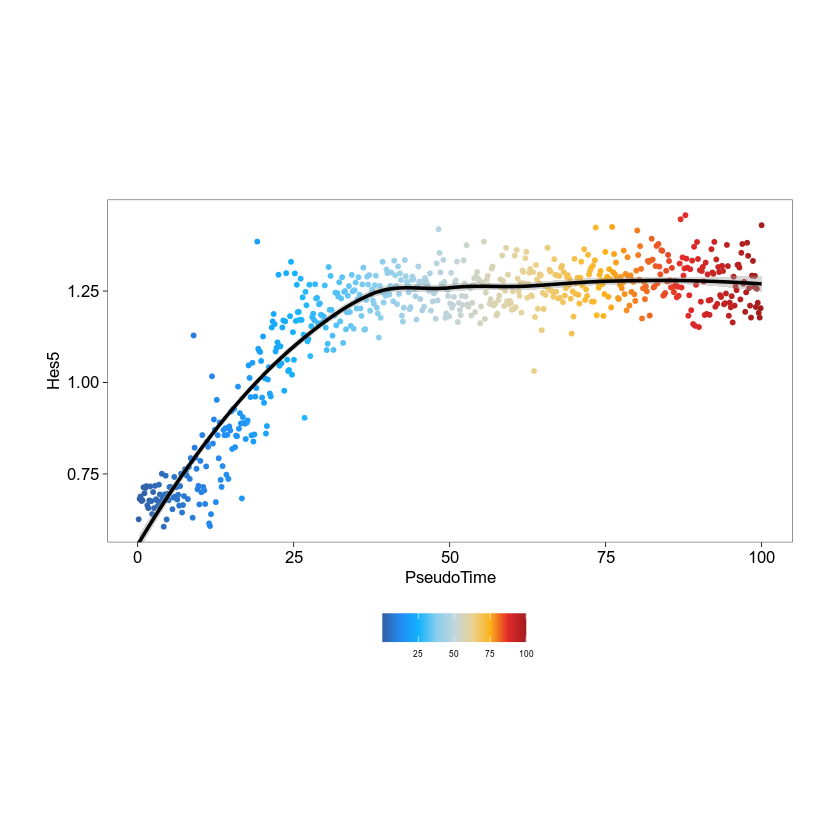

In [16]:
plotTrajectory(Merged.proj.male, trajectory = "Major_trajectory", 
                     colorBy = "GeneScoreMatrix", name = "Hes5", continuousSet = "solarExtra",quantCut = c(0.01, 1))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-5d4122335e89-Date-2022-01-03_Time-14-46-52.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2022-01-03 14:46:52 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting

Warning message:
“Removed 1004 rows containing non-finite values (stat_summary_hex).”
Plotting Trajectory

Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-5d4122335e89-Date-2022-01-03_Time-14-46-52.log

Warning message:
“Removed 1004 rows containing non-finite values (stat_summary_hex).”
`geom_smooth()` using method = 'loess' and formula 'y ~ x'



[[1]]

[[2]]


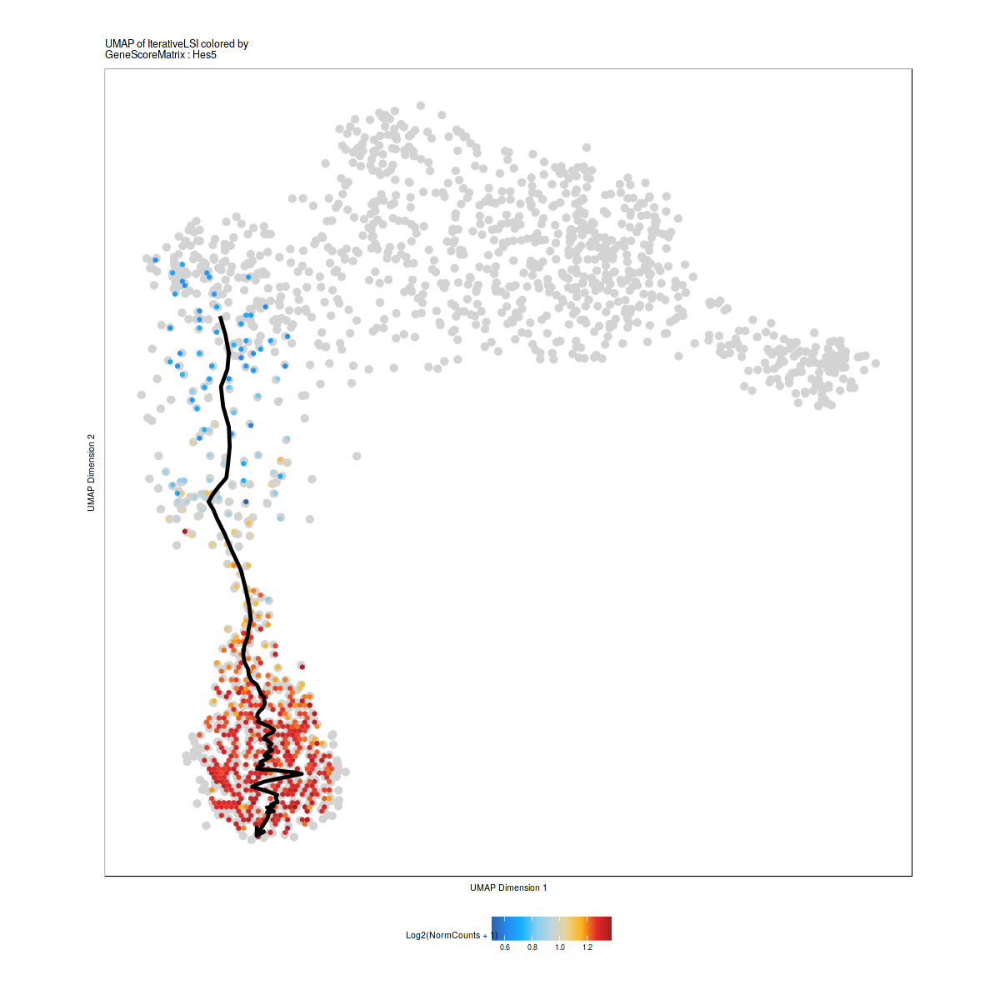

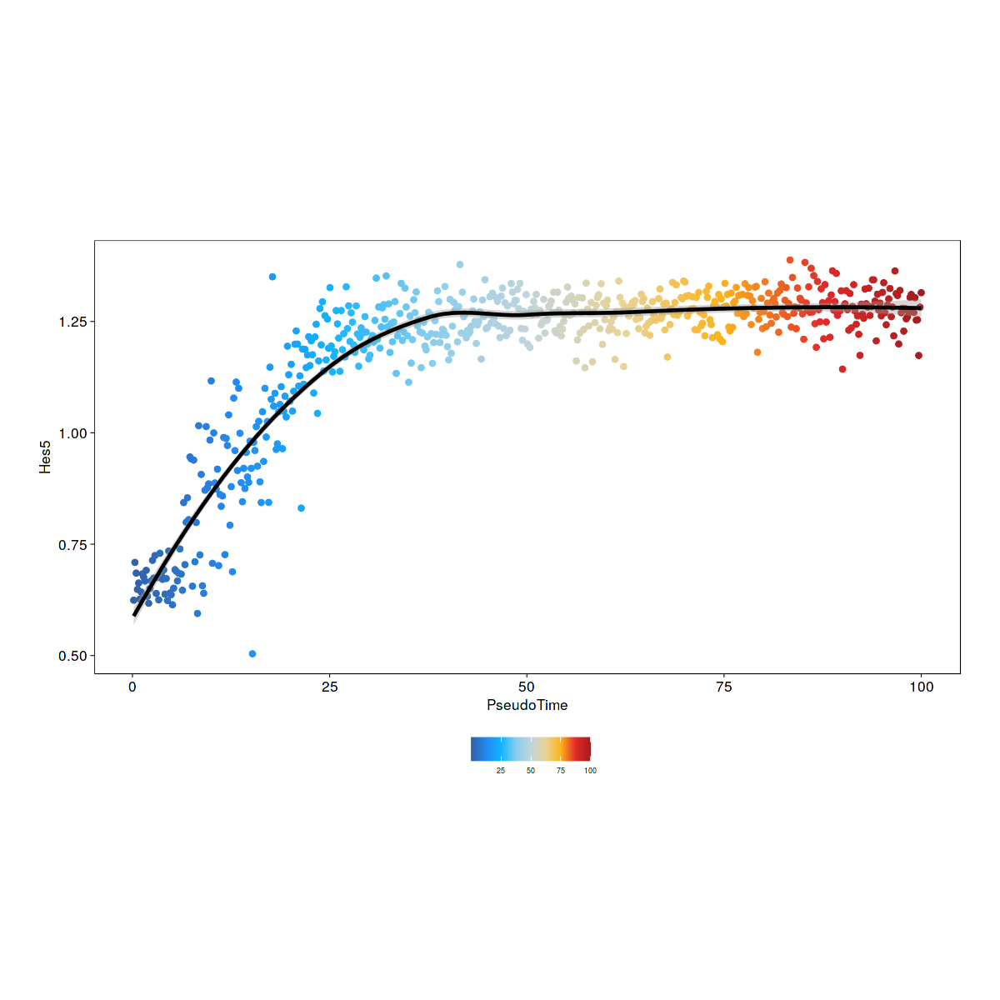

In [209]:
plotTrajectory(Merged.proj.male, trajectory = "Major_trajectory", 
                     colorBy = "GeneScoreMatrix", name = "Hes5", continuousSet = "solarExtra",quantCut = c(0.01, 1))

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-856073a23984-Date-2023-04-20_Time-20-54-08.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-856073a23984-Date-2023-04-20_Time-20-54-08.log



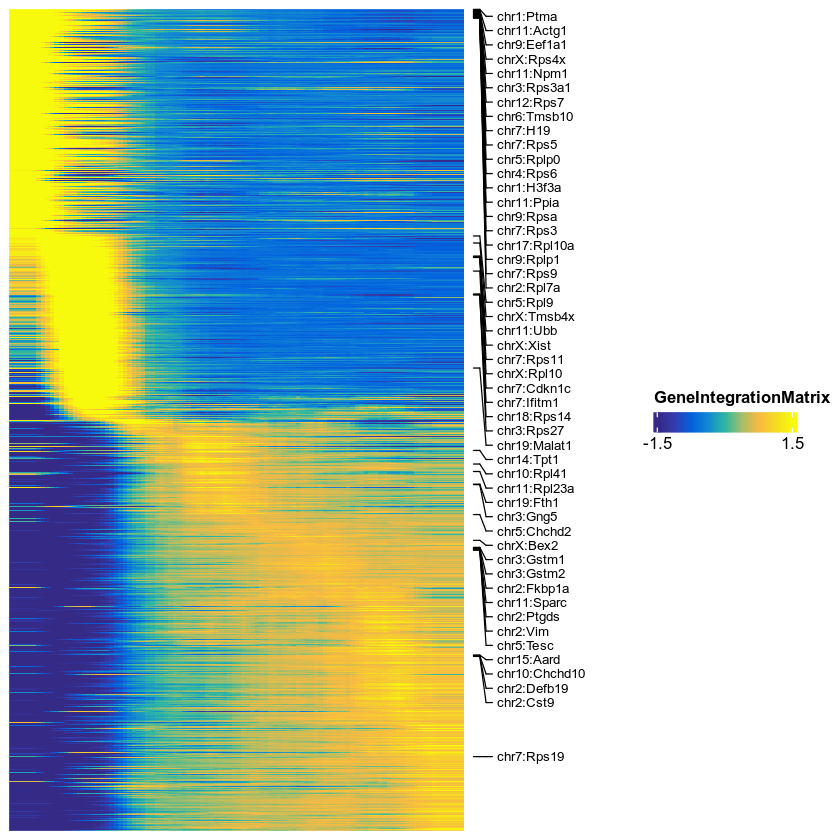

In [18]:
trajGIM <- getTrajectory(ArchRProj = Merged.proj.male, name = "Major_trajectory", useMatrix = "GeneIntegrationMatrix", log2Norm = FALSE)
p3 <- plotTrajectoryHeatmap(trajGIM,  pal = paletteContinuous(set = "blueYellow"))
p3

In [19]:
saveRDS(Merged.proj.male,"./Merged.proj.male.2023//Save-ArchR-Project.rds")

In [29]:
combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-8560321bed44-Date-2023-04-20_Time-21-17-26.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-8560321bed44-Date-2023-04-20_Time-21-17-26.log



In [4]:
#integration
corGSM_MM <- correlateTrajectories(trajGSM, trajMM,corCutOff = 0.2,varCutOff1=0.5,varCutOff2=0.5)
trajGSM2 <- trajGSM[corGSM_MM[[1]]$name1, ]
trajMM2 <- trajMM[corGSM_MM[[1]]$name2, ]

trajCombined <- trajGSM2
assay(trajCombined) <- t(apply(assay(
    trajGSM2), 1, scale)) + t(apply(assay(trajMM2), 1, scale))

combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)


ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85602598b282-Date-2023-04-20_Time-21-19-08.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85602598b282-Date-2023-04-20_Time-21-19-08.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85605310d44b-Date-2023-04-20_Time-21-19-10.log
If there is an issue, please report to github with logFile!

useSeqnames is NULL or greater than 1 with a Sparse.Assays.Matrix trajectory input.

2023-04-20 21:19:10 : 

force=FALSE thus continuing with subsetting useSeqnames = z

2023-04-20 21:19:10 : 

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTr

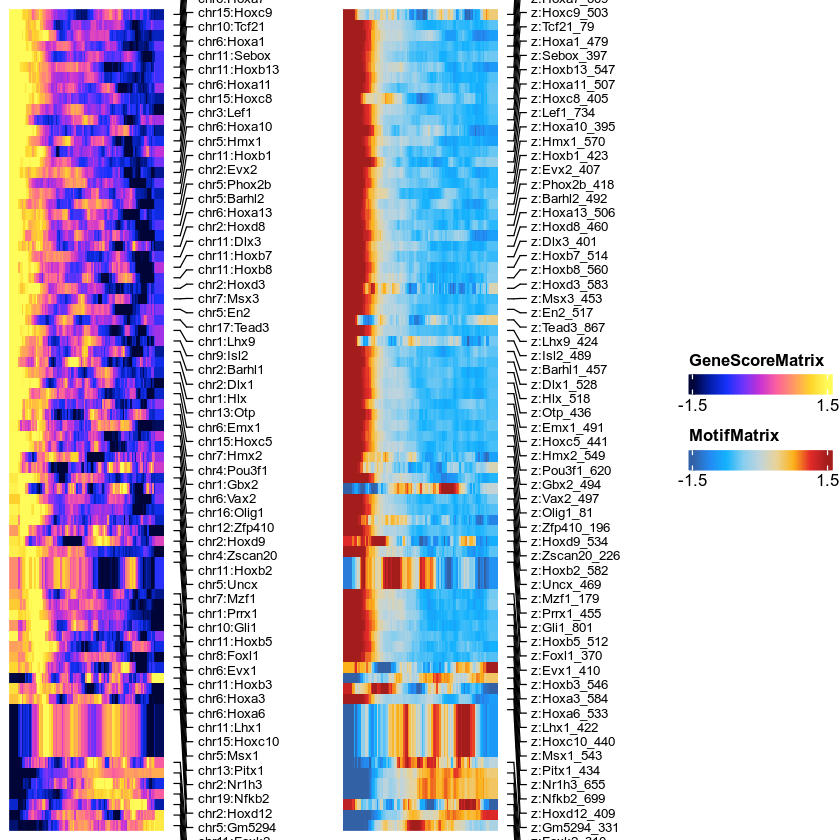

In [35]:
rowOrder <- match(rownames(combinedMat), rownames(trajGSM2))
ht1 <- plotTrajectoryHeatmap(trajGSM2,  pal = paletteContinuous(set = "horizonExtra"),  varCutOff = 0, rowOrder = rowOrder, labelTop = 100)
ht2 <- plotTrajectoryHeatmap(trajMM2, pal = paletteContinuous(set = "solarExtra"), varCutOff = 0, rowOrder = rowOrder, labelTop = 100)
ht1 + ht2

In [83]:
combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85601d3f82e1-Date-2023-04-20_Time-21-43-43.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85601d3f82e1-Date-2023-04-20_Time-21-43-43.log



In [5]:
#integration
corGSM_GIM <- correlateTrajectories(trajGSM, trajGIM,corCutOff = 0.2,varCutOff1=0.5,varCutOff2=0.5)
trajGSM2 <- trajGSM[corGSM_GIM[[1]]$name1, ]
trajGIM2 <- trajGIM[corGSM_GIM[[1]]$name2, ]

trajCombined <- trajGSM2
assay(trajCombined) <- t(apply(assay(
    trajGSM2), 1, scale)) + t(apply(assay(trajGIM2), 1, scale))

combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)


ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85602a097497-Date-2023-04-20_Time-21-44-03.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85602a097497-Date-2023-04-20_Time-21-44-03.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85602931e892-Date-2023-04-20_Time-21-44-04.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-85602931e892-Date-2023-04-20_Time-21-44-04.log



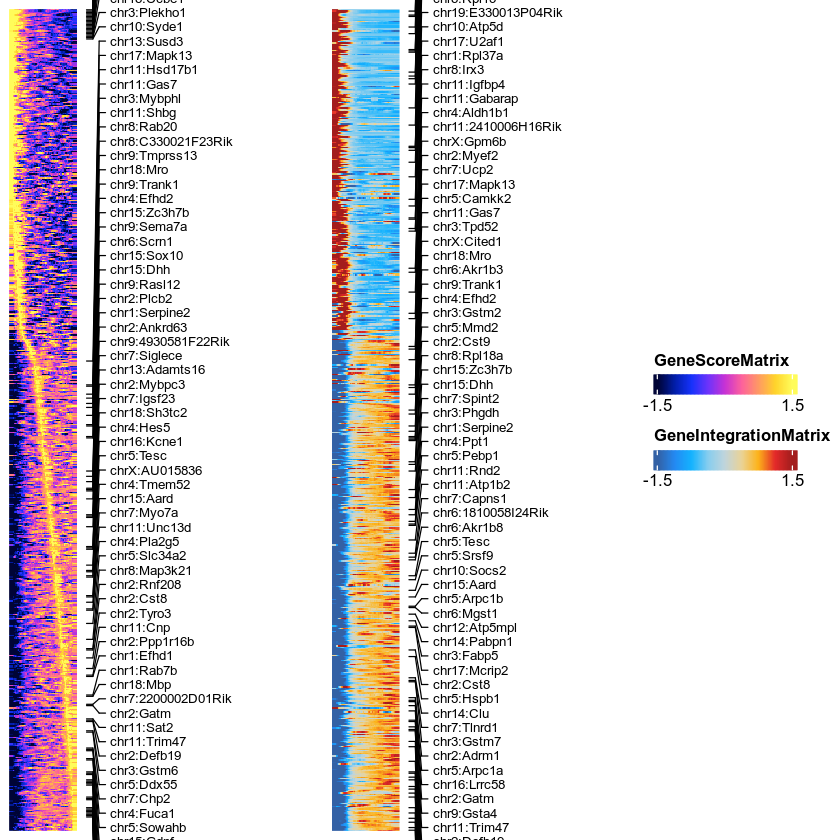

In [87]:
rowOrder <- match(rownames(combinedMat), rownames(trajGSM2))
ht1 <- plotTrajectoryHeatmap(trajGSM2,  pal = paletteContinuous(set = "horizonExtra"),  varCutOff = 0, rowOrder = rowOrder, labelTop = 100)
ht2 <- plotTrajectoryHeatmap(trajGIM2, pal = paletteContinuous(set = "solarExtra"), varCutOff = 0, rowOrder = rowOrder, labelTop = 100)
ht1 + ht2

In [219]:
pdf("./2022Figure/202112.sertoli.time.MM.GSM.integration.pdf")
ht1 + ht2
dev.off()

png 
  2

In [310]:
# Plot footprint
# motif name
motifPositions <- getPositions(Merged.proj2)
motifs <- c("Tcf3","Id4","Id3","Esr2","Snai2")
markerMotifs <- unlist(lapply(motifs, function(x) grep(x, names(motifPositions), value = TRUE)))
# markerMotifs <- markerMotifs[markerMotifs %ni% "SREBF1_22"]
markerMotifs

[1] "Tcf3_31"   "Id4_35"    "Id3_22"    "Esr2_668"  "Snai2_799"

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d417df139ca-Date-2022-01-17_Time-23-23-33.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2022-01-17 23:23:33 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d417df139ca-Date-2022-01-17_Time-23-23-33.log



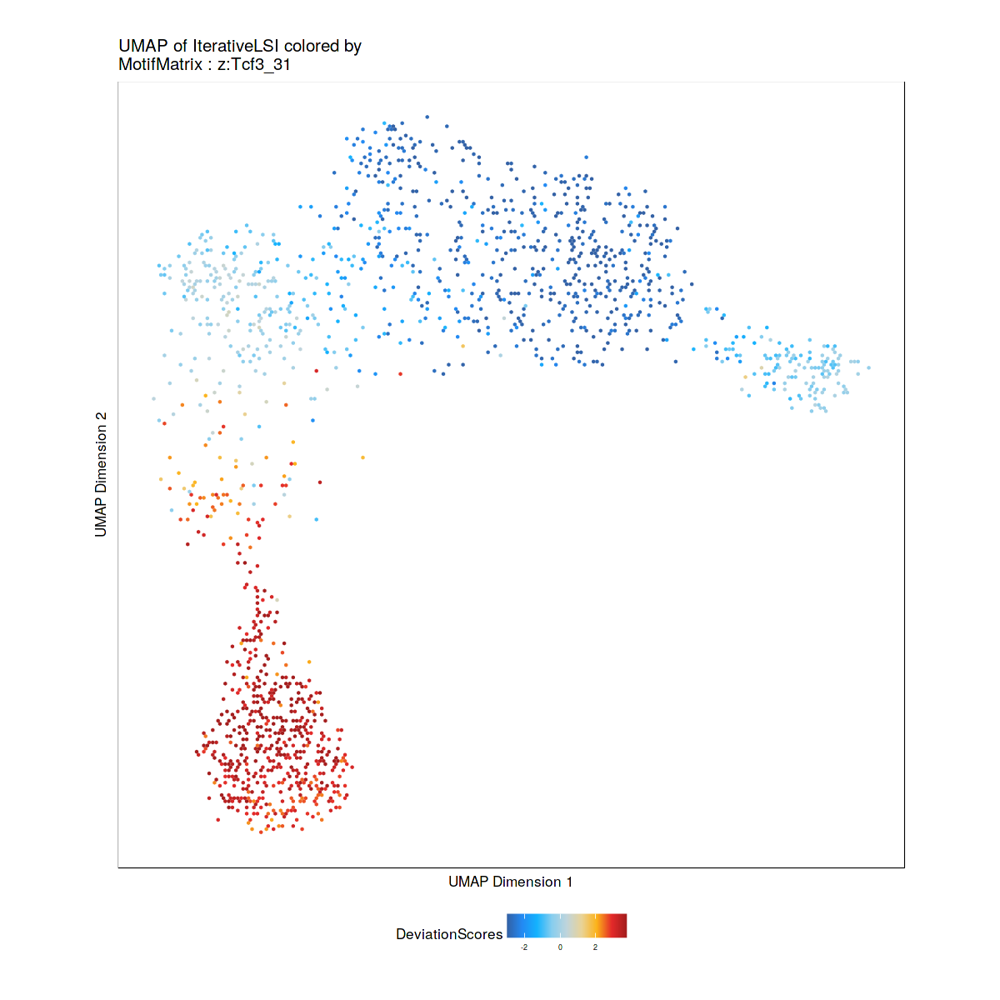

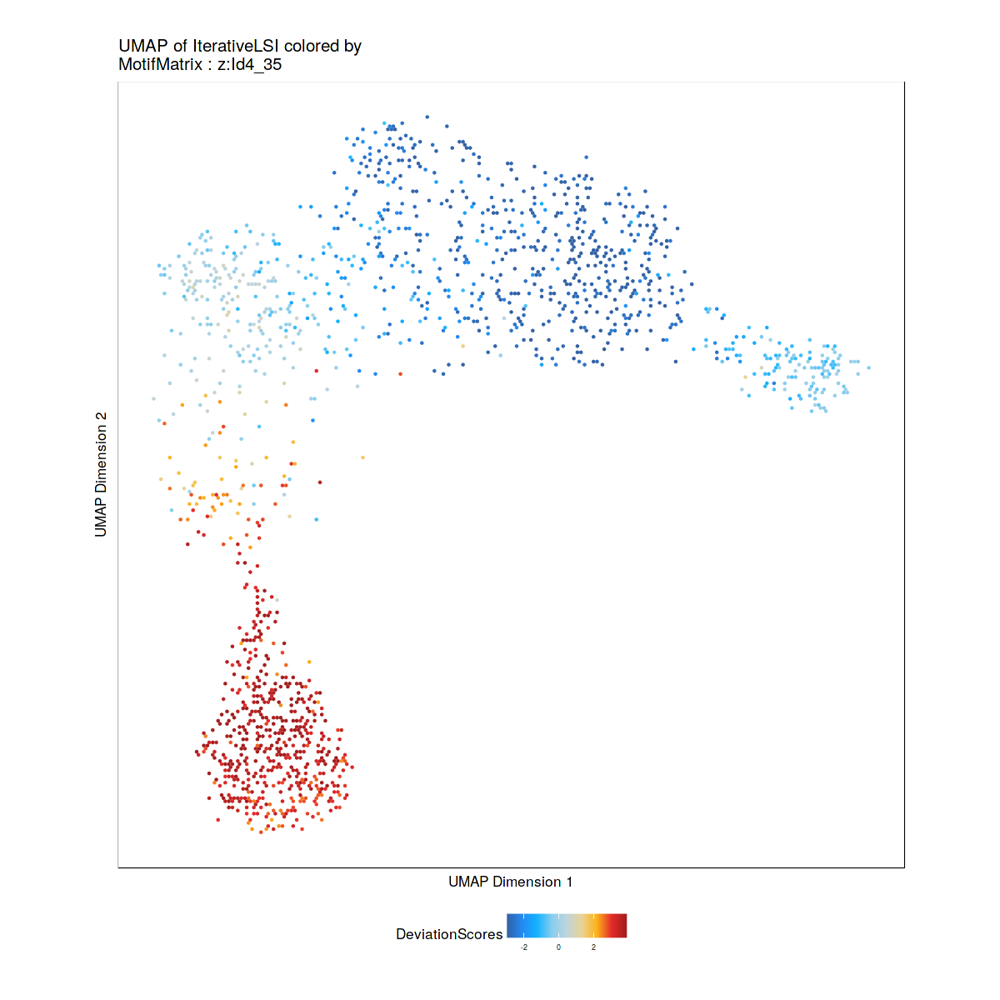

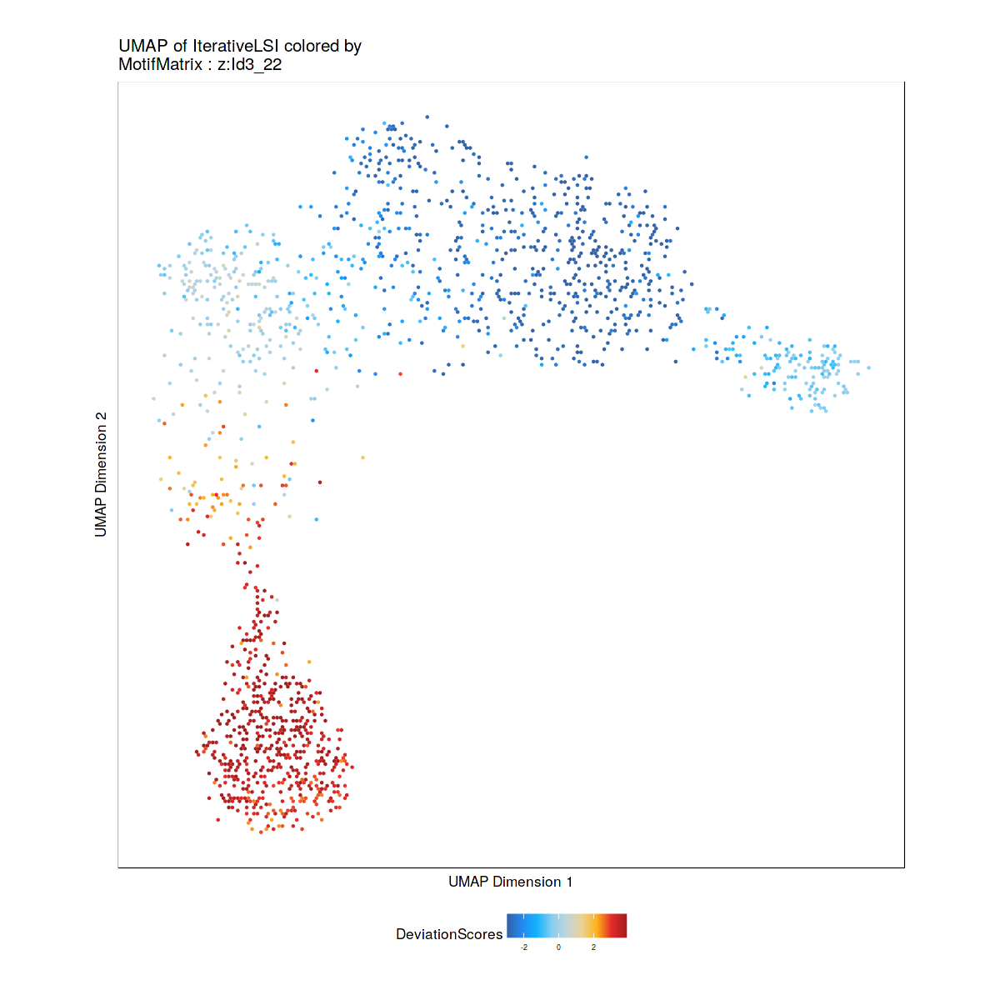

$`z:Tcf3_31`

$`z:Id4_35`

$`z:Id3_22`

$`z:Esr2_668`

$`z:Snai2_799`


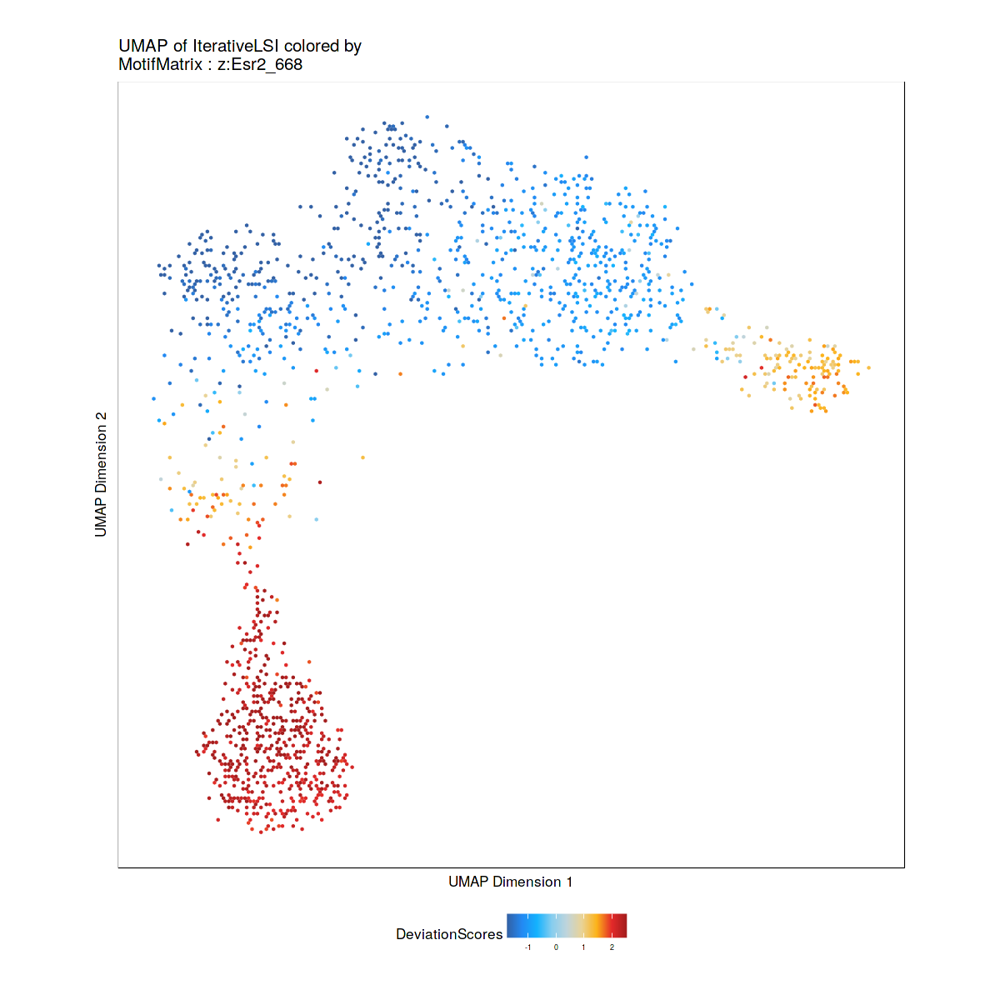

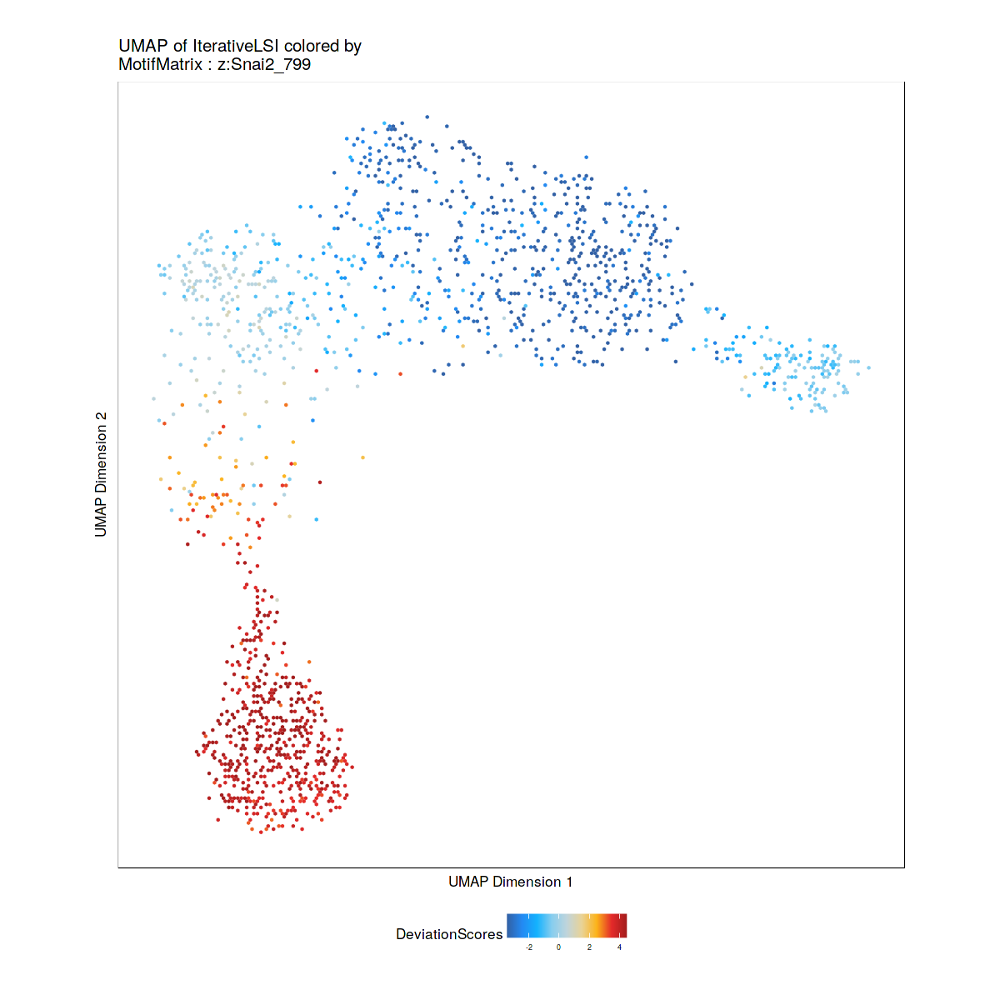

In [311]:
plotEmbedding(ArchRProj = Merged.proj.male,  colorBy = "MotifMatrix", name = c("z:Tcf3_31","z:Id4_35","z:Id3_22","z:Esr2_668","z:Snai2_799"), embedding = "UMAP",size = 1,
#                     pal = horizonExtra,
                    imputeWeights = getImputeWeights(Merged.proj.male),quantCut = c(0.1, 0.9))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d417d7e8d57-Date-2022-01-17_Time-23-19-21.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-01-17 23:19:21 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d417d7e8d57-Date-2022-01-17_Time-23-19-21.log



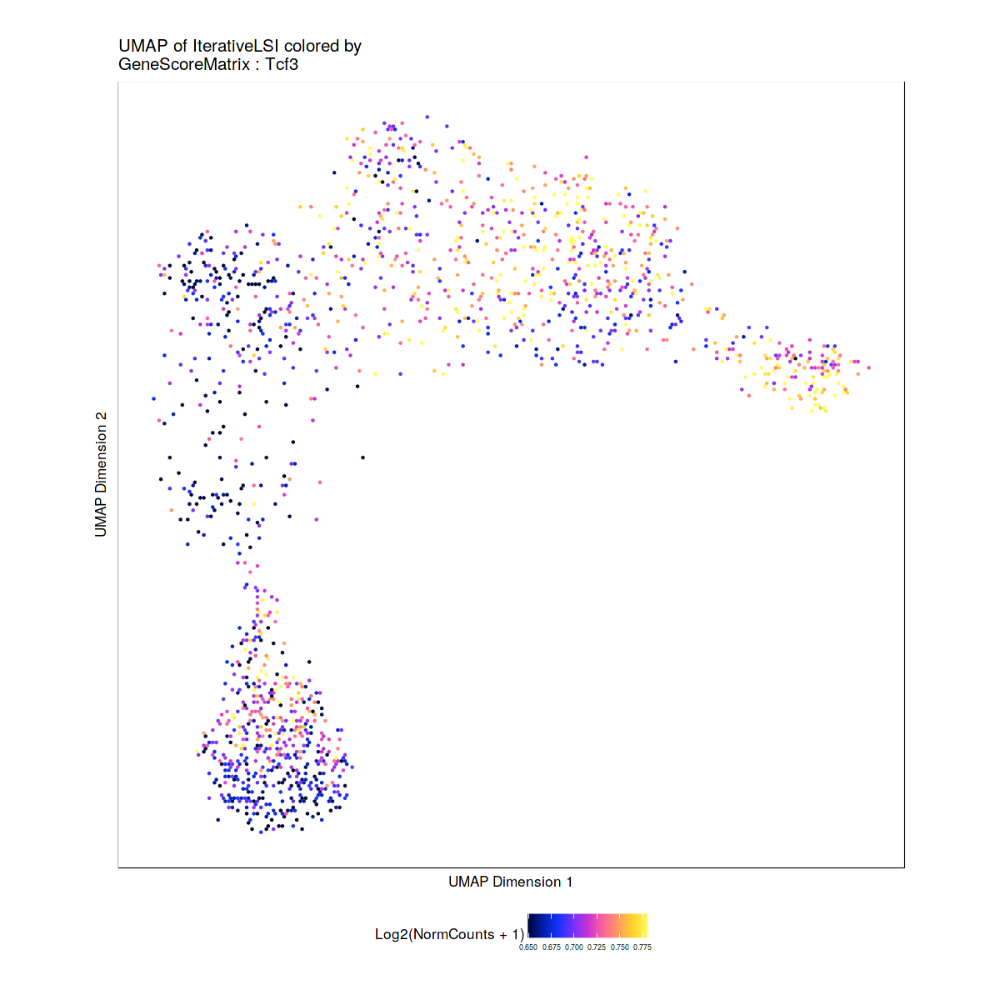

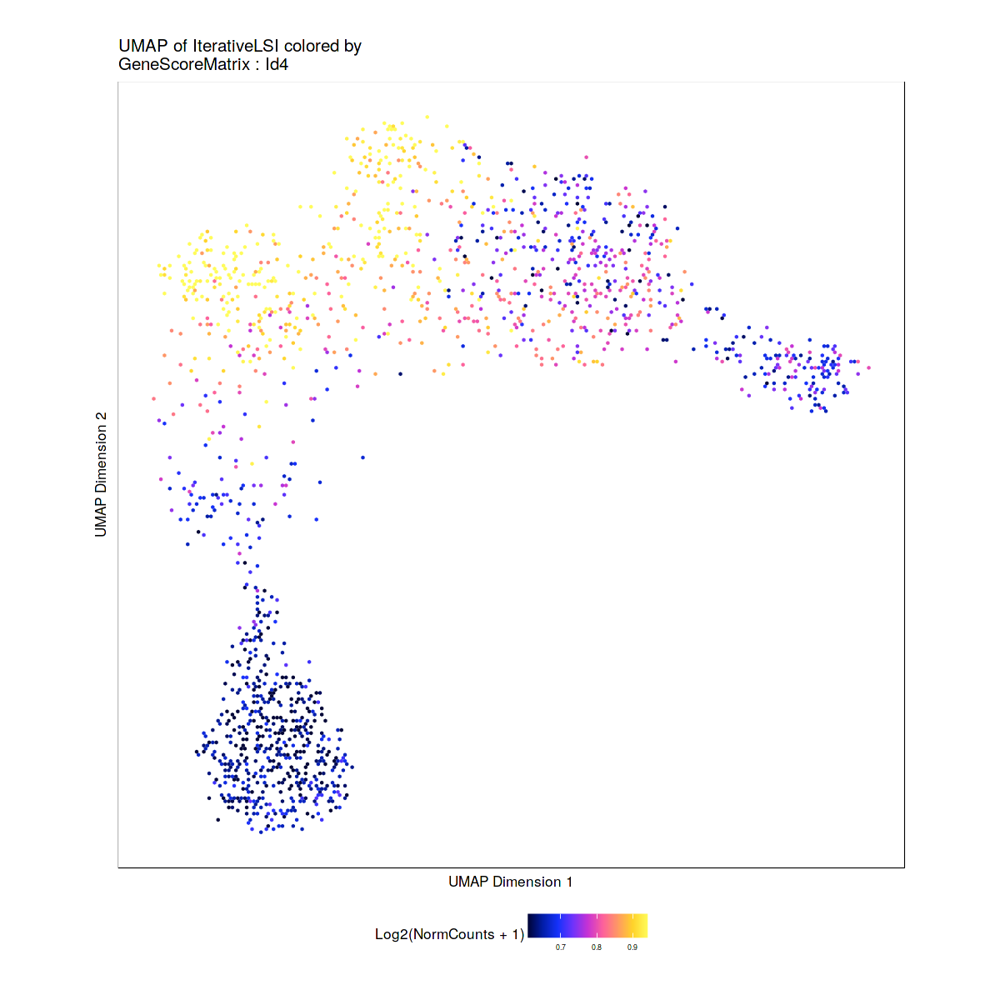

$Tcf3

$Id4

$Id3

$Esr2


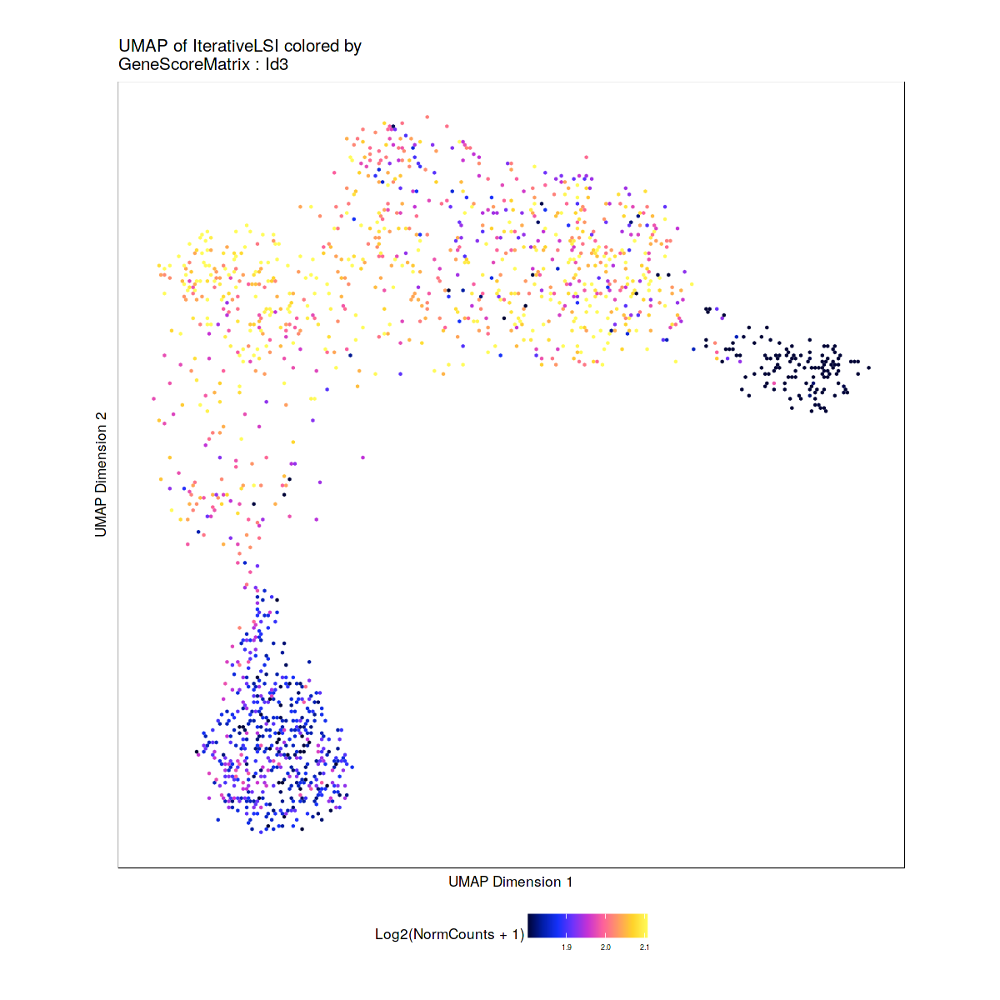

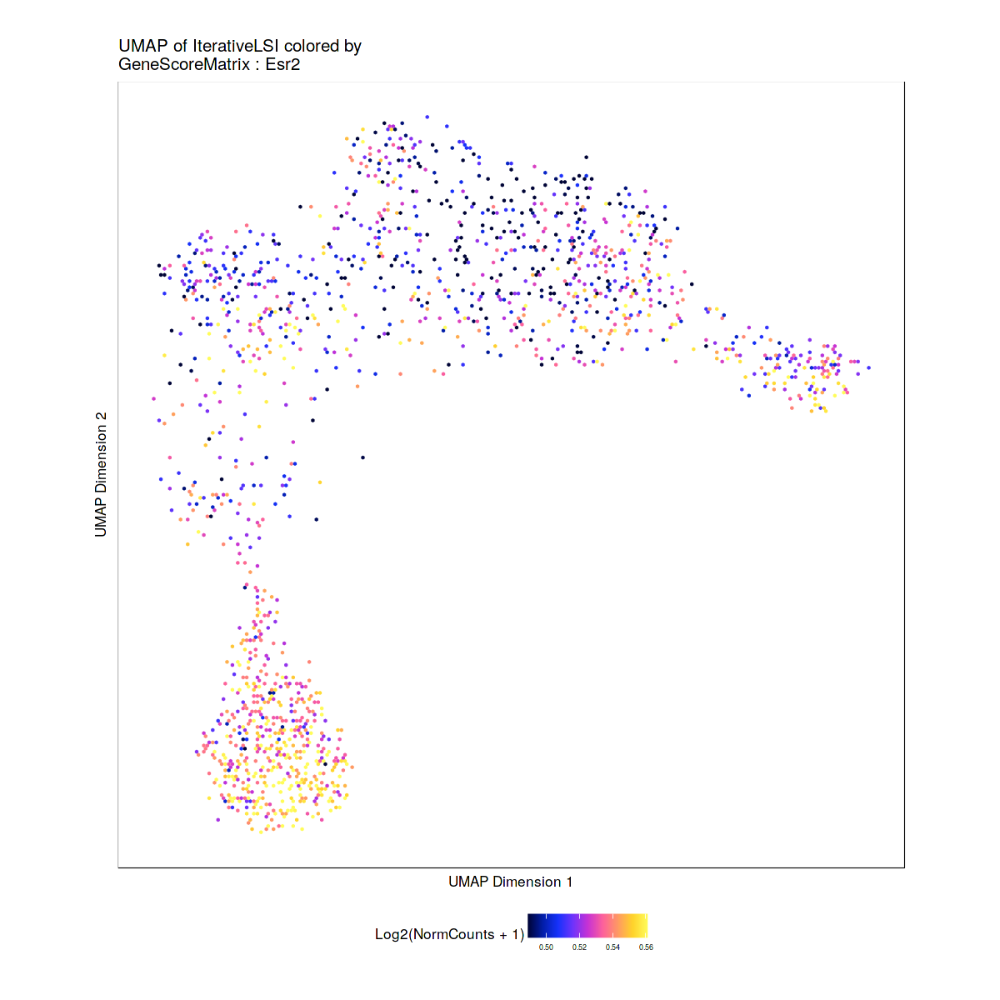

In [309]:
plotEmbedding(ArchRProj = Merged.proj.male,  colorBy = "GenescoreMatrix", name = c("Tcf3","Id4","Id3","Esr2","S"), embedding = "UMAP",size = 1,
#                     pal = horizonExtra,
                    imputeWeights = getImputeWeights(Merged.proj.male),quantCut = c(0.1, 0.9))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d417ba78777-Date-2022-01-17_Time-23-12-44.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2022-01-17 23:12:44 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d417ba78777-Date-2022-01-17_Time-23-12-44.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d41316d1c4f-Date-2022-01-17_Time-23-12-46.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-01-17 23:12:46 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d41316d1c4f-Date-2022-01-17_Time-23-12-46.log



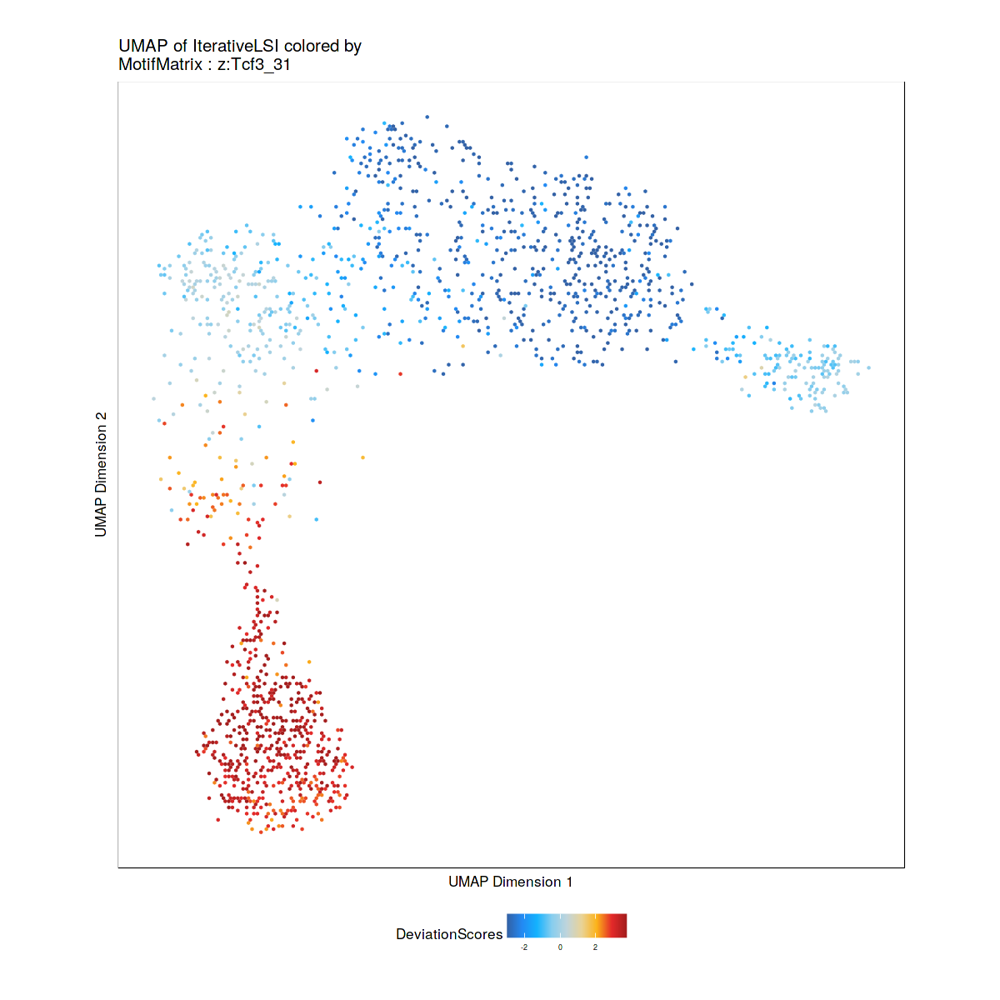

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5d41404771fe-Date-2022-01-17_Time-23-12-48.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2022-01-17 23:12:48 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-5d41404771fe-Date-2022-01-17_Time-23-12-48.log



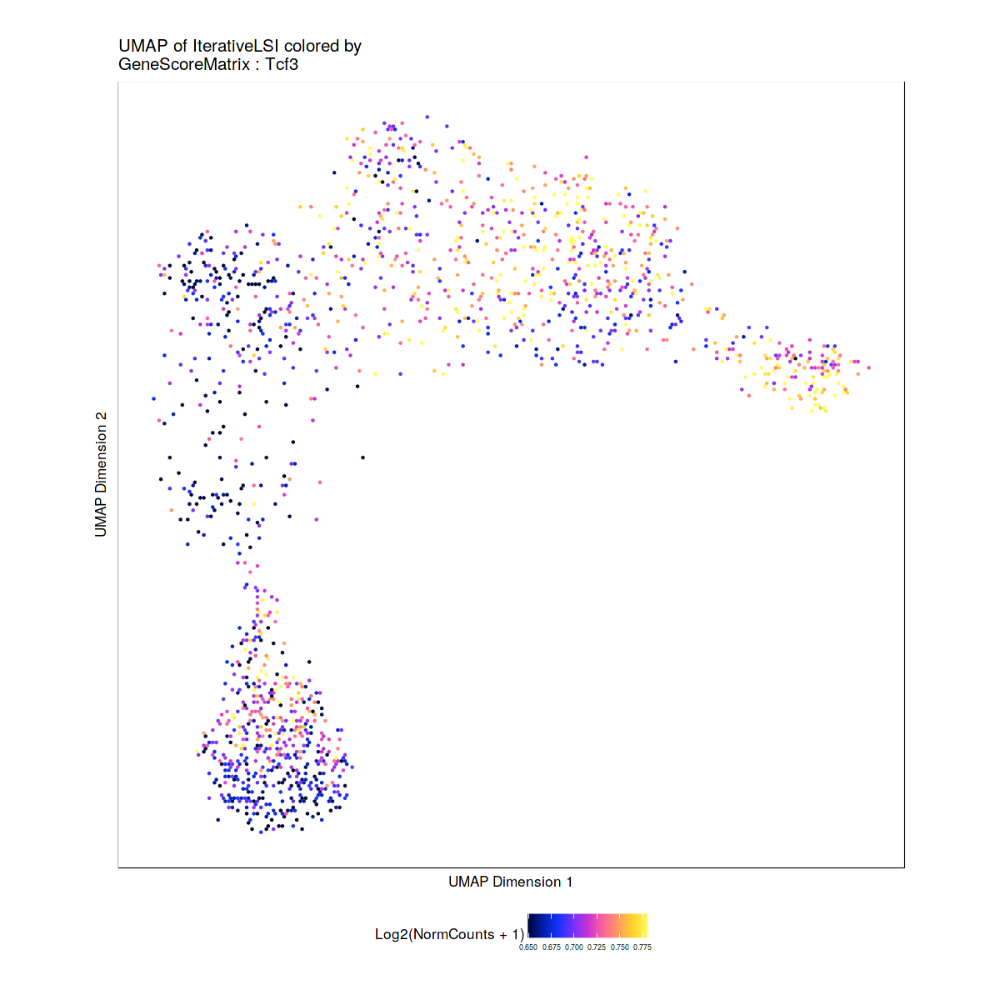

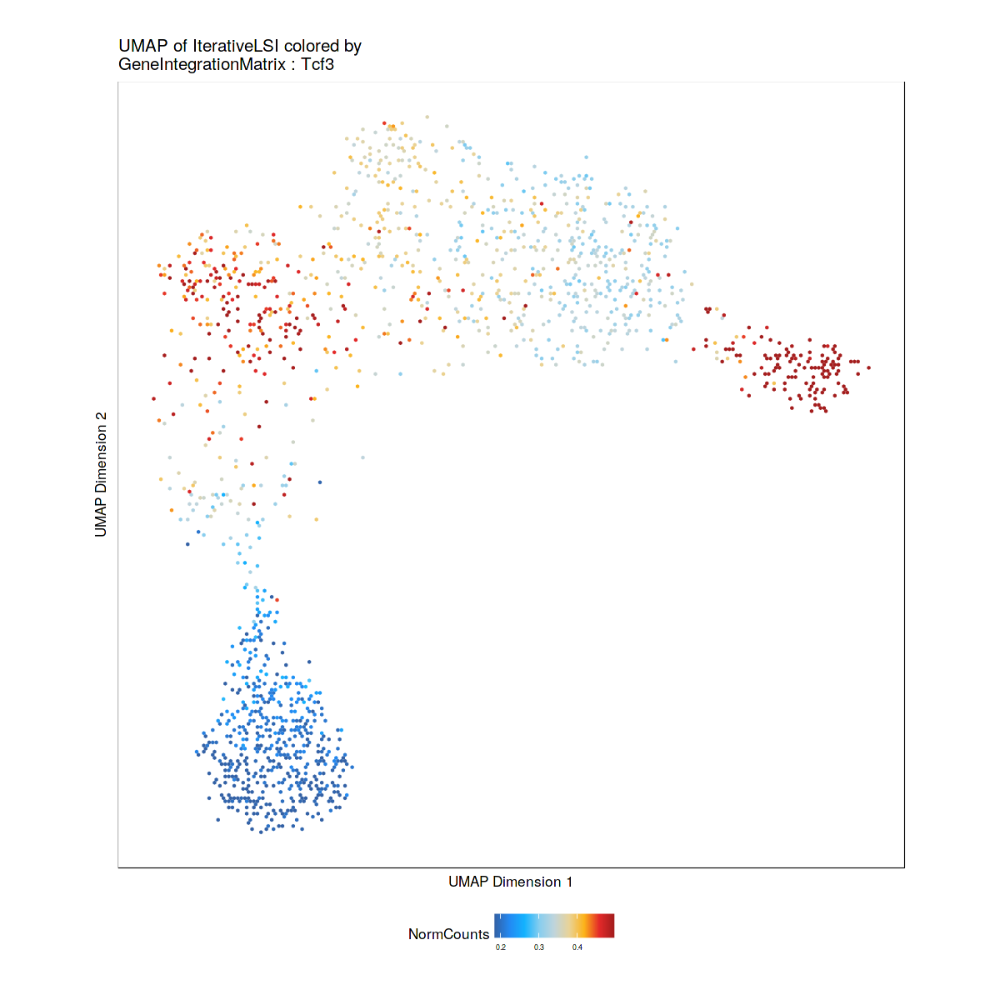

In [305]:
plotEmbedding(ArchRProj = Merged.proj.male,  colorBy = "MotifMatrix", name = "z:Tcf3_31", embedding = "UMAP",size = 1,
#                     pal = horizonExtra,
                    imputeWeights = getImputeWeights(Merged.proj.male),quantCut = c(0.1, 0.9))
plotEmbedding(ArchRProj = Merged.proj.male,  colorBy = "GenescoreMatrix", name = "Tcf3", embedding = "UMAP",size = 1,
#                     pal = horizonExtra,
                    imputeWeights = getImputeWeights(Merged.proj.male),quantCut = c(0.1, 0.9))
plotEmbedding(ArchRProj = Merged.proj.male,  colorBy = "GeneIntegrationMatrix", name = "Tcf3", embedding = "UMAP",size = 1,
#                     pal = horizonExtra,
                    imputeWeights = getImputeWeights(Merged.proj.male),quantCut = c(0.1, 0.9))

In [105]:
Merged.proj.male <- saveArchRProject(ArchRProj = Merged.proj.male,outputDirectory = "Somatic_cell_subset_4sample_male", load = TRUE,overwrite = TRUE)
saveRDS(Merged.proj.male,file="./Somatic_cell_subset_4sample_male/Save-ArchR-Project.rds")
Merged.proj.male <- readRDS(file="./Somatic_cell_subset_4sample/Save-ArchR-Project.rds")
Merged.proj.male

Copying ArchRProject to new outputDirectory : /home/leetl/sex_differentiation/Somatic_cell_subset_4sample_male

Copying Arrow Files...

Copying Arrow Files (1 of 4)

Copying Arrow Files (2 of 4)

Copying Arrow Files (3 of 4)

Copying Arrow Files (4 of 4)

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 9): Annotations

Copying Other Files (2 of 9): Background-Peaks.rds

Copying Other Files (3 of 9): Embeddings

Copying Other Files (4 of 9): GroupCoverages

Copying Other Files (5 of 9): IterativeLSI

Copying Other Files (6 of 9): Peak2GeneLinks

Copying Other Files (7 of 9): PeakCalls

Copying Other Files (8 of 9): Plots

Copying Other Files (9 of 9): RNAIntegration

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\     

class: ArchRProject 
outputDirectory: /home/leetl/sex_differentiation/gonad_fil_somatic202112 
samples(4): TP15 TP12 TP13 TP14
sampleColData names(1): ArrowFiles
cellColData names(84): Sample TSSEnrichment ... 9 10
numberOfCells(1): 5093
medianTSS(1): 20.934
medianFrags(1): 9362

In [1]:
Merged.proj.male <- readRDS(file="./Somatic_cell_subset_4sample/Save-ArchR-Project.rds")
Merged.proj.male

Loading required package: ArchR


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .______

class: ArchRProject 
outputDirectory: /home/leetl/sex_differentiation/all_cell_4sample_202112 
samples(4): TP15 TP12 TP13 TP14
sampleColData names(1): ArrowFiles
cellColData names(88): Sample TSSEnrichment ... 13 14
numberOfCells(1): 9494
medianTSS(1): 20.5725
medianFrags(1): 10257